# **Vegetable Image Classification**

## **1. Introduction**

---

**Name**    : Iznia Azyati




**URL**
- **Dataset** : [Vegetable Image Dataset](https://www.kaggle.com/datasets/misrakahmed/vegetable-image-dataset)

- **Hugging Face**: [Link](https://huggingface.co/spaces/Iznia/Vegetable_Image_Classification)

---

**Problem Statement**

Dalam industri pertanian, identifikasi yang akurat dan cepat terhadap jenis sayuran sangat penting untuk berbagai aplikasi seperti pengelolaan stok, pemasaran, dan pemrosesan makanan. Namun, identifikasi manual dari berbagai jenis sayuran memerlukan tenaga kerja yang signifikan dan rentan terhadap kesalahan manusia. Selain itu, kesulitan dalam mengidentifikasi jenis sayuran dari gambar dapat menghambat efisiensi operasional dan meningkatkan biaya produksi. Memperbaiki akurasi dan kecepatan identifikasi sayuran melalui analisis gambar dapat secara signifikan meningkatkan efisiensi dan akurasi dalam industri ini.

Dataset yang digunakan dalam analisis ini berfokus pada gambar berbagai jenis sayuran.

**Background**

Pertama, dataset akan dimuat langsung sebagai train, validation, dan test set, serta data akan dilakukan EDA yang mencakup visualisasi dan karakteristik gambar. Selanjutnya, arsitektur model CNN akan dibangun dengan menggabungkan convolutional layers, pooling layers, and fully connected layers. Model-model tersebut akan ditrain dan di evaluasi menggunakan metrik seperti `accuracy` dan `loss`. Setelah itu, model CNN yang telah ditrain akan diterapkan untuk inference, yang memungkinkan pengguna untuk memasukkan gambar sayuran untuk prediksi.


**Objective**

Tujuan dari proyek ini adalah untuk membuat model **Convolutional Neural Network (CNN)** yang dapat mengidentifikasi jenis sayuran dari gambar dengan akurat. Model ini akan digunakan untuk membedakan antara beberapa kategori sayuran yang berbeda, menggunakan **`accuracy`** dan **`loss`** sebagai metrik evaluasi utama. Dengan menerapkan teknik **computer vision** yang canggih, proyek ini bertujuan untuk meningkatkan efisiensi identifikasi sayuran, mengurangi kesalahan manusia, dan meningkatkan operasional di berbagai aplikasi pertanian dan industri makanan.


---

## **2. Libraries**

Import Library yang dibutuhkan untuk pembuatan model.

In [ ]:
# import data for data loading dan data operations
import numpy as np
import pandas as pd
from PIL import Image
from PIL.ExifTags import TAGS
import random
from google.colab import drive
import os
import glob
import cv2
import math

# Import libraries for data visualization
import matplotlib.pyplot as plt
import seaborn as sns
import random


# Import libraries for model creation (nueral network creation)
import tensorflow as tf
from tensorflow import keras
from keras.models import Sequential, Model
from keras.layers import Input, Conv2D, BatchNormalization, ReLU, MaxPooling2D, GlobalAveragePooling2D, Dense, Dropout, Concatenate, Flatten
from keras.preprocessing import image

# Import libraries for feature engineering
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import VGG16
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.preprocessing import image


# Import libraries for model training
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, LearningRateScheduler

from tensorflow.keras.callbacks import ReduceLROnPlateau
from tensorflow.keras.regularizers import l2


# Import libraries for model evaluation
from sklearn.metrics import confusion_matrix, classification_report


import warnings
warnings.filterwarnings('ignore')

## **3. Data Loading**

Pada tahap awal ini, data dimuat dan dataframe dibuat untuk mempermudah analisis lebih lanjut.

Gambar-gambar tersebut berasal dari Kaggle, diunduh, dan kemudian diunggah ke Google Drive. Oleh karena itu, langkah pertama adalah connect Google Drive untuk menghubungkannya dengan Google Colab. Dataset asli sudah terbagi menjadi train, validation, dan test set. Oleh karena itu, kita tidak perlu melakukan splitting lagi.

In [ ]:
# Connect to google drive
drive.mount('/content/drive')

Mounted at /content/drive


Dengan Google Drive berhasil diconnect-kan dengan Google Colab, langkah berikutnya adalah define path/jalur ke setiap folder dan menentukan kelas untuk gambar-gambar tersebut.

In [ ]:
# Define the path to the dataset
dataset_path = '/content/drive/My Drive/Dataset_GC7'

**Define Paths for Train, Validation, and Test Sets**

In [ ]:
# Define paths for train, validation, and test sets
train_path = os.path.join(dataset_path, 'train')
validation_path = os.path.join(dataset_path, 'validation')
test_path = os.path.join(dataset_path, 'test')

# Define categories
categories = ['Cabbage', 'Capsicum', 'Carrot', 'Cauliflower', 'Pumpkin']


Define categories ini menentukan **kategori (kelas)** yang akan digunakan dalam dataset. Hanya lima kelas yang digunakan dari kemungkinan lima belas kelas dalam dataset asli. Kelas-kelas ini adalah `'Cabbage', 'Capsicum', 'Carrot', 'Cauliflower', dan 'Pumpkin'`.

Dalam project ini, Saya menggunakan subset dari dataset yang terdiri dari hanya **5 kelas** dari 15 kelas asli. Subset ini memungkinkan untuk fokus pada bagian dataset yang lebih kecil dan lebih mudah dikelola, yang sangat berguna untuk prototyping dan pengembangan model awal.

Dataset yang digunakan untuk pelatihan (training), validasi (validation), dan pengujian (testing) diatur ke dalam tiga folder terpisah di Google Drive. Setiap folder berisi gambar yang diklasifikasikan ke dalam kategori yang ditentukan. Dengan menentukan path dan kategori dengan cara ini, kita dapat memuat dan melakukan pra-pemrosesan data secara efisien untuk pelatihan dan evaluasi model.

**Create DataFrame for Each Set**

In [ ]:
def create_dataframe(data_path, categories):
    data = []
    for category in categories:
        category_path = os.path.join(data_path, category)
        for image_file in glob.glob(os.path.join(category_path, '*.jpg')):
            data.append((image_file, category))
    return pd.DataFrame(data, columns=['image_path', 'category'])

# Buat dataframe untuk set train, validation, dan test
train_df = create_dataframe(train_path, categories)
validation_df = create_dataframe(validation_path, categories)
test_df = create_dataframe(test_path, categories)

# Tampilkan beberapa baris pertama dari setiap dataframe
# Display Train Set
print("Train DataFrame")
train_df.head()

Train DataFrame


,image_path,category
0,/content/drive/My Drive/Dataset_GC7/train/Cabb...,Cabbage
1,/content/drive/My Drive/Dataset_GC7/train/Cabb...,Cabbage
2,/content/drive/My Drive/Dataset_GC7/train/Cabb...,Cabbage
3,/content/drive/My Drive/Dataset_GC7/train/Cabb...,Cabbage
4,/content/drive/My Drive/Dataset_GC7/train/Cabb...,Cabbage


In [ ]:
# Display Validation Set
print("Validation DataFrame")
validation_df.head()

Validation DataFrame


,image_path,category
0,/content/drive/My Drive/Dataset_GC7/validation...,Cabbage
1,/content/drive/My Drive/Dataset_GC7/validation...,Cabbage
2,/content/drive/My Drive/Dataset_GC7/validation...,Cabbage
3,/content/drive/My Drive/Dataset_GC7/validation...,Cabbage
4,/content/drive/My Drive/Dataset_GC7/validation...,Cabbage


In [ ]:
# Display Test Set
print("Test DataFrame")
test_df.head()

Test DataFrame


,image_path,category
0,/content/drive/My Drive/Dataset_GC7/test/Cabba...,Cabbage
1,/content/drive/My Drive/Dataset_GC7/test/Cabba...,Cabbage
2,/content/drive/My Drive/Dataset_GC7/test/Cabba...,Cabbage
3,/content/drive/My Drive/Dataset_GC7/test/Cabba...,Cabbage
4,/content/drive/My Drive/Dataset_GC7/test/Cabba...,Cabbage


Seperti terlihat di atas, dataframe telah berhasil dibuat dan siap untuk dianalisis lebih lanjut.

## **4. Exploratory Data Analysis (EDA)**



Setelah loading data, langkah selanjutnya adalah mengeksplorasi distribusi dan karakteristik data. Eksplorasi ini menggunakan visualisasi seperti bar charts, scatter plots, histograms, dan metode lain untuk mendapatkan pemahaman yang lebih mendalam tentang dataset.

### **i. Showing The Images Of Each Class**

Tujuan dari langkah ini adalah untuk menampilkan beberapa gambar dari setiap kategori dalam dataset. Hal ini membantu kita untuk memverifikasi label dan karakteristik gambar dalam setiap kategori.


In [ ]:
# Function to display a visualization of the first 5 images from each class
def plot_images(path):
  labels = os.listdir(path)
  for label in labels:
    folder_path = os.path.join(path, label)
    fig = plt.figure(figsize=(20, 20))
    columns = 5
    rows = 1
    print('Class : ', label)
    images = os.listdir(folder_path)
    for index in range(1, columns*rows +1):
        fig.add_subplot(rows, columns, index)
        image = plt.imread(os.path.join(folder_path, images[index]))
        plt.imshow(image)
        plt.axis("off")
    plt.show()

Class :  Capsicum


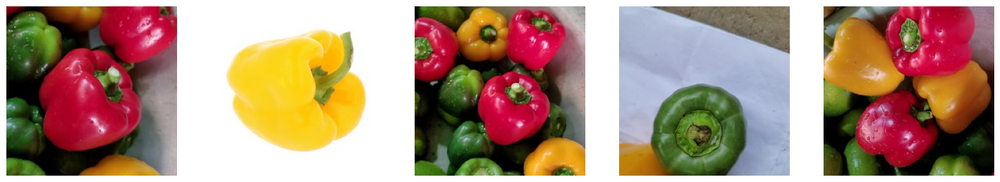

Class :  Pumpkin


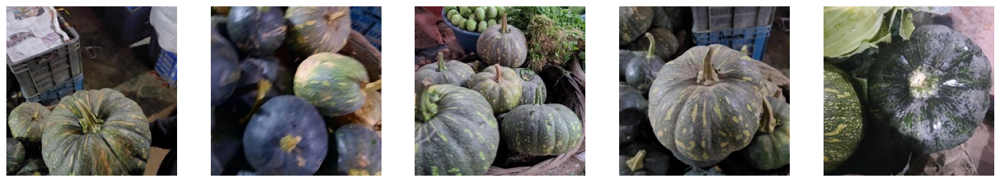

Class :  Cauliflower


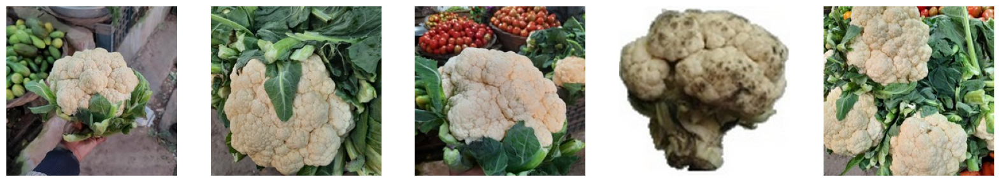

Class :  Cabbage


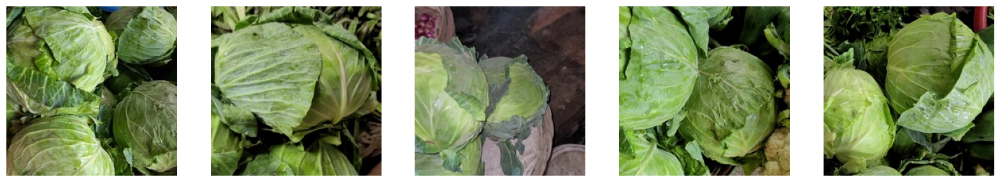

Class :  Carrot


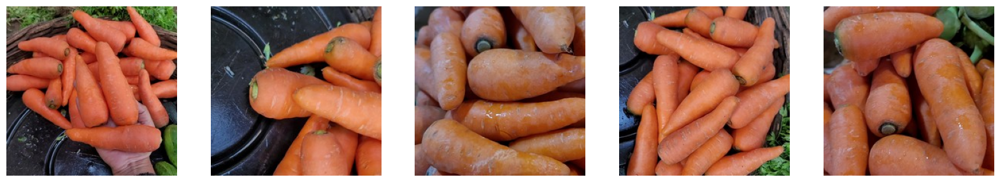

In [ ]:
# Displays a visualization of the first 5 images from each class in the Train Set
plot_images(train_path)

Class :  Cauliflower


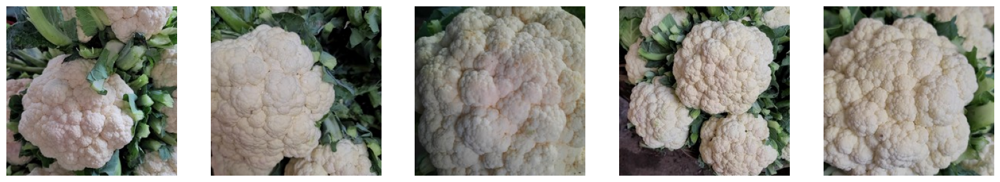

Class :  Capsicum


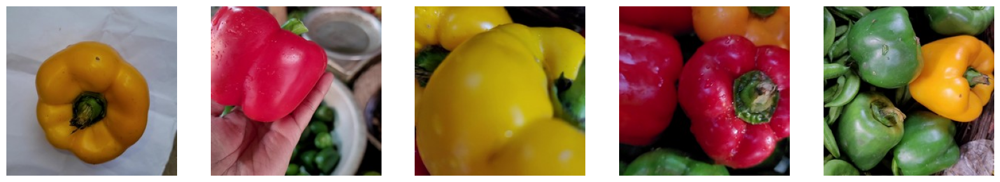

Class :  Cabbage


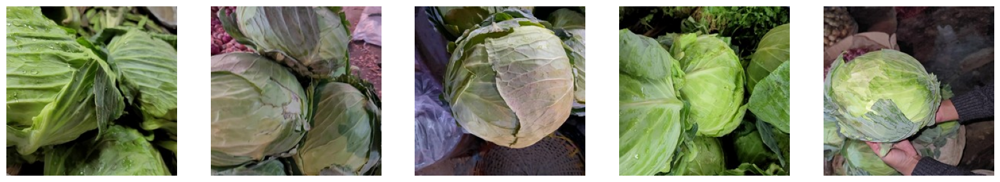

Class :  Pumpkin


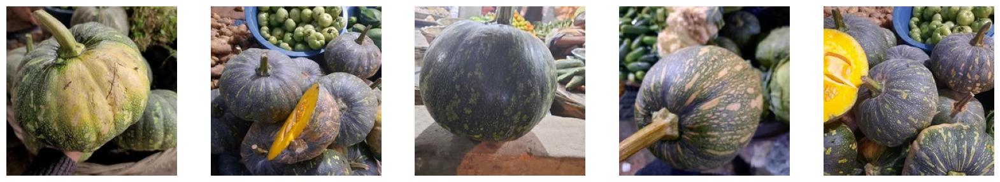

Class :  Carrot


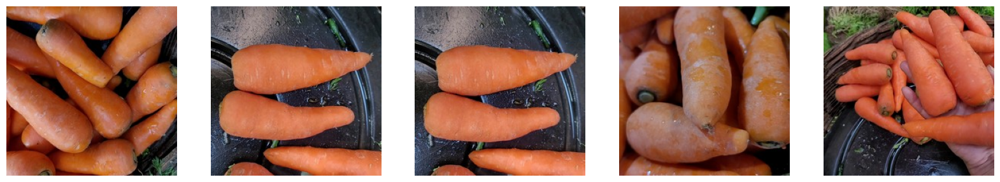

In [ ]:
# Displays a visualization of the first 5 images from each class in the Validation Set
plot_images(validation_path)

Class :  Cabbage


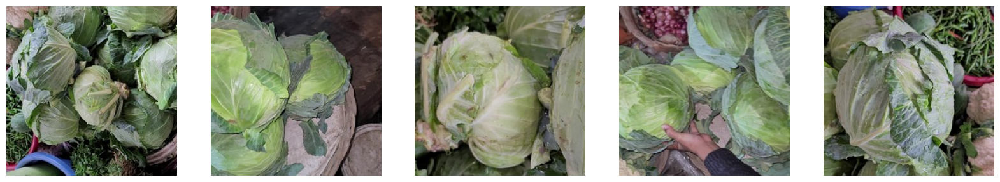

Class :  Cauliflower


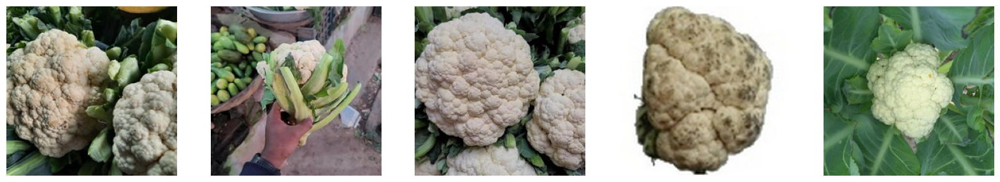

Class :  Pumpkin


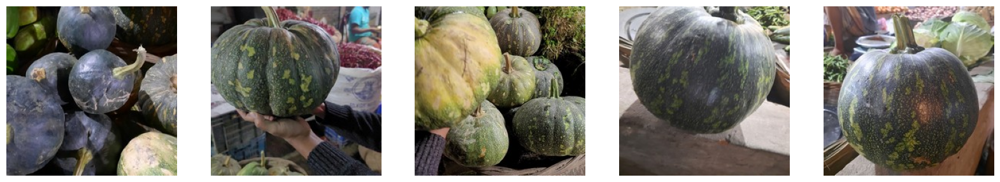

Class :  Capsicum


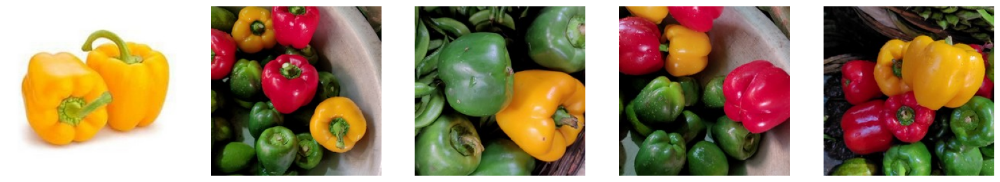

Class :  Carrot


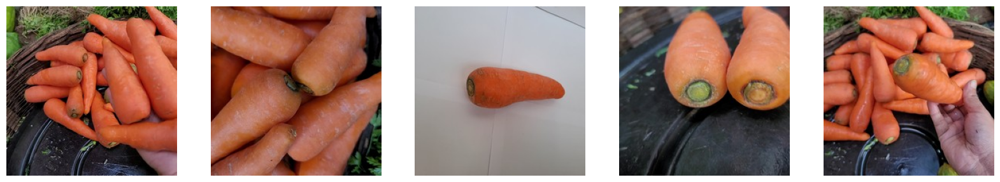

In [ ]:
# Displays a visualization of the first 5 images from each class in the Test Set
plot_images(test_path)

**Explanation:**

- **Cabbage**

  Cabbage memiliki bentuk bulat atau oval dengan daun yang rapat membentuk kepala yang padat. Warnanya bervariasi dari hijau muda hingga hijau tua dengan permukaan yang sedikit keriput. Cabbage adalah sayuran yang umum digunakan dalam banyak masakan dan dikenal karena manfaat kesehatannya. Bentuk kepala yang padat dan daun yang rapat membuatnya mudah dikenali.


- **Cauliflower**

  Cauliflower memiliki kepala besar yang terdiri dari bunga-bunga kecil yang rapat, melekat pada batang yang tebal. Warnanya putih krem dan memiliki pola yang khas saat dilihat dari atas. Kembang kol sering digunakan dalam masakan dan dikenal karena manfaat kesehatannya. Struktur bunga yang padat dan warna putih kremnya membuatnya mudah dikenali.

- **Cucumber**

  Cucumbers adalah buah silindris yang panjang dengan kulit halus dan lilin berwarna hijau cerah. Mereka memiliki garis-garis longitudinal halus dan umumnya berbentuk seragam. Mentimun banyak digunakan dalam salad dan memiliki kandungan air yang tinggi. Bentuk silindris dan kulit halusnya memudahkan identifikasi.

- **Pumpkin**

  Pumpkins adalah buah bulat atau oval besar dengan kulit yang tebal dan bergaris. Warnanya bervariasi dari oranye hingga hijau. Labu memiliki tangkai kayu yang menonjol di bagian atas. Labu dikenal karena digunakan dalam berbagai festival dan masakan. Bentuk besar dan warnanya yang mencolok membuatnya mudah dikenali.

### **ii. Class Distributions**

Langkah selanjutnya dalam EDA yaitu cek distribusi kelas untuk memahami jumlah gambar dalam setiap kategori.

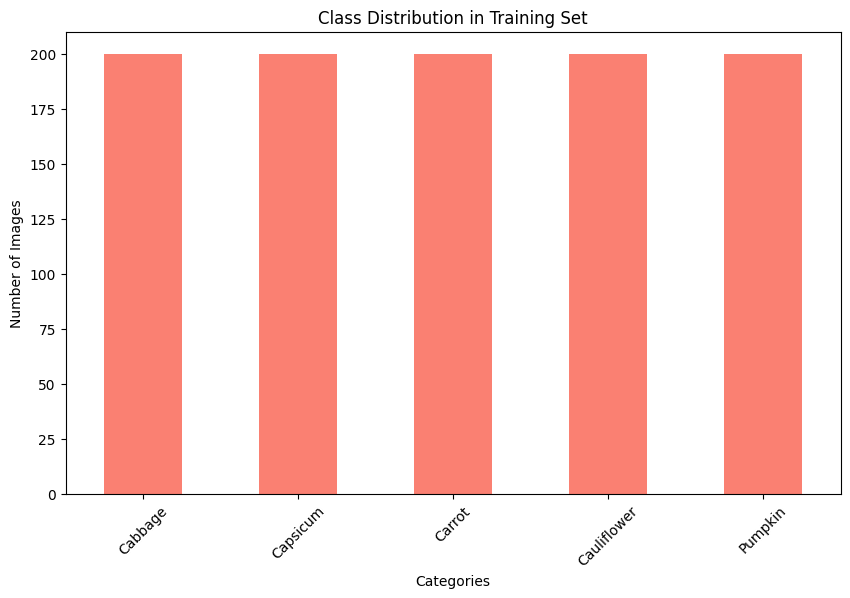

In [ ]:
# Hitung jumlah gambar dalam setiap kelas
class_counts = train_df['category'].value_counts()

# Plot distribusi kelas
plt.figure(figsize=(10, 6))
class_counts.plot(kind='bar', color='salmon')
plt.xlabel('Categories')
plt.ylabel('Number of Images')
plt.title('Class Distribution in Training Set')
plt.xticks(rotation=45)
plt.show()


**Explanation:**

Bar chart menunjukkan distribusi gambar untuk lima kelas sayuran dalam dataset kita:

1. **Capsicum**: Memiliki jumlah gambar terbanyak dengan sekitar 200 gambar, menunjukkan fokus signifikan pada pengumpulan gambar paprika dalam berbagai warna dan bentuk.

2. **Cabbage**: Terdapat sekitar 200 gambar, mengindikasikan fokus yang mirip pada pengumpulan gambar kubis yang memiliki berbagai ukuran dan warna.

3. **Carrot**: Terdapat sekitar 200 gambar wortel, menunjukkan usaha untuk menangkap variasi dalam bentuk dan warna wortel.

4. **Cauliflower**: Juga memiliki sekitar 200 gambar, menunjukkan perhatian pada pengumpulan gambar kembang kol yang memiliki variasi bentuk dan tekstur.

5. **Pumpkin**: Terdapat sekitar 200 gambar labu, menunjukkan fokus pada pengumpulan berbagai jenis dan ukuran labu.


Jumlah gambar yang banyak untuk setiap kelas sayuran memastikan bahwa dataset ini seimbang dan representatif. Hal ini penting untuk memastikan model yang dilatih dapat mengenali dan mengklasifikasikan setiap jenis sayuran dengan baik. Dengan distribusi yang seimbang ini, kita dapat meningkatkan akurasi model dalam mengenali setiap kategori sayuran.

### **iii. Plotting The Data's Balance**


Langkah ini memvisualisasikan keseimbangan jumlah sampel dalam setiap kelas di set pelatihan. Kita menghitung jumlah gambar dalam setiap kategori dengan menghitung jumlah file dalam setiap folder kategori. Data jumlah gambar divisualisasikan menggunakan horizontal bar plot, yang memudahkan kita untuk melihat apakah jumlah gambar dalam setiap kategori seimbang.



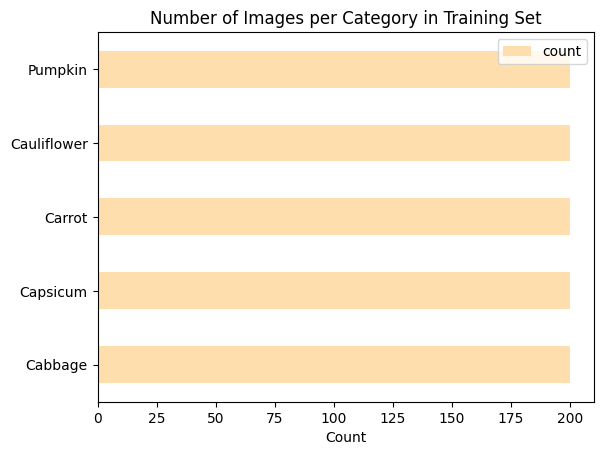

In [ ]:
images_length = {}
for i, cat in enumerate(categories):
    image_path = train_path + '/' + cat
    images_in_folder = os.listdir(image_path)
    images_length[cat] = len(images_in_folder)

pd.DataFrame(images_length, index=['count']).T.plot(kind='barh', color='navajowhite')
plt.xlabel('Count')
plt.title('Number of Images per Category in Training Set')
plt.show()


**Explanation:**

Grafik batang horizontal menunjukkan keseimbangan jumlah sampel dalam setiap kelas di train set:

Keseimbangan jumlah gambar dalam setiap kelas sangat penting dalam pembelajaran mesin, terutama dalam pelatihan model klasifikasi. Keseimbangan ini memastikan bahwa model tidak bias terhadap satu kelas tertentu dan dapat mengenali setiap kelas dengan baik. Hal ini juga membantu dalam menghindari overfitting pada kelas yang memiliki lebih banyak gambar.

Dengan dataset yang seimbang, model akan dilatih dengan jumlah data yang hampir sama untuk setiap kelas, sehingga dapat mengenali pola dan fitur penting dari setiap kategori sayuran dengan lebih baik. Ini akan meningkatkan akurasi dan generalisasi model ketika diterapkan pada data baru.

### **iv. Analisis Distribusi Warna**


Distribusi warna memberikan wawasan tentang bagaimana warna digunakan di seluruh gambar dalam dataset. Kita dapat menghitung dan memvisualisasikan distribusi warna untuk seluruh gambar.

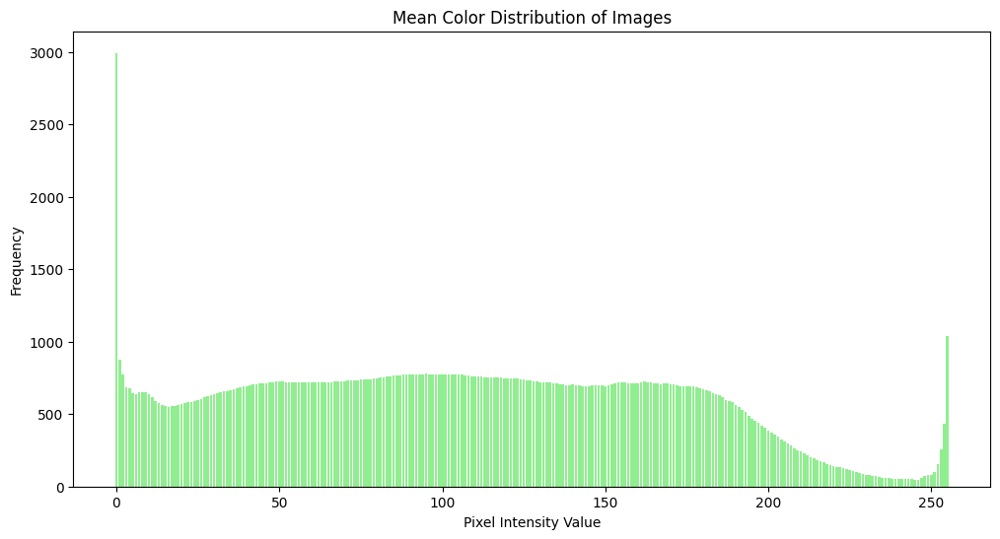

In [ ]:
# Define categories
categories = ['Cabbage', 'Capsicum', 'Carrot', 'Cauliflower', 'Pumpkin']

# Create empty list to store color distributions
color_distributions = []

# Iterate through all images in the dataset
for category in categories:
    category_path = os.path.join(train_path, category)
    for img_path in glob.glob(os.path.join(category_path, '*.jpg')):
        # Load image
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        # Extract color distribution
        mean_color_distribution = np.bincount(img.flatten(), minlength=256)
        color_distributions.append(mean_color_distribution)

color_distributions = np.array(color_distributions)

# Plotting the color distribution
mean_color_distribution = np.mean(color_distributions, axis=0)

plt.figure(figsize=(12, 6))
plt.bar(range(256), mean_color_distribution, color='lightgreen')
plt.title('Mean Color Distribution of Images')
plt.xlabel('Pixel Intensity Value')
plt.ylabel('Frequency')
plt.show()

**Insight:**

- Grafik distribusi warna menunjukkan frekuensi intensitas pixel dari gambar-gambar dalam dataset.
- Dari grafik, dapat dilihat bahwa ada puncak pada intensitas rendah (pixel gelap) dan intensitas tinggi (pixel terang).
- Hal ini menunjukkan bahwa gambar dalam dataset memiliki variasi yang cukup besar dalam hal pencahayaan dan kontras.

### **v. Statistik Intensitas Piksel**


Menganalisis statistik intensitas piksel seperti mean, median, dan standard deviation akan memberikan wawasan tentang kecerahan dan kontras gambar.



In [ ]:
# Create empty dictionary to store intensity statistics for each class
class_intensity_stats = {}

# Iterate over unique classes in the dataset
for category in categories:
    category_path = os.path.join(train_path, category)
    intensity_values = []

    # Iterate over image paths in the filtered list
    for img_path in glob.glob(os.path.join(category_path, '*.jpg')):
        # Load image
        img = cv2.imread(img_path)

        # Convert image to grayscale
        gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        intensity_values.extend(gray_img.flatten())

    # Calculate statistics for intensity values
    mean_intensity = np.mean(intensity_values)
    median_intensity = np.median(intensity_values)
    std_intensity = np.std(intensity_values)

    # Store statistics in the dictionary
    class_intensity_stats[category] = {
        'Mean Intensity': mean_intensity,
        'Median Intensity': median_intensity,
        'Standard Deviation of Intensity': std_intensity
    }

# Print statistics for each class
for category, stats in class_intensity_stats.items():
    print(f"Class: {category}")
    print(f"Mean Intensity: {stats['Mean Intensity']}")
    print(f"Median Intensity: {stats['Median Intensity']}")
    print(f"Standard Deviation of Intensity: {stats['Standard Deviation of Intensity']}")
    print()


Class: Cabbage
Mean Intensity: 116.10699398118622
Median Intensity: 122.0
Standard Deviation of Intensity: 52.84324007247155

Class: Capsicum
Mean Intensity: 108.02547024473851
Median Intensity: 104.0
Standard Deviation of Intensity: 61.43427897886191

Class: Carrot
Mean Intensity: 105.60993482940052
Median Intensity: 112.0
Standard Deviation of Intensity: 47.92229071795286

Class: Cauliflower
Mean Intensity: 120.7966087372449
Median Intensity: 127.0
Standard Deviation of Intensity: 61.01856365394292

Class: Pumpkin
Mean Intensity: 97.52915088887117
Median Intensity: 94.0
Standard Deviation of Intensity: 57.334540219546334



**Insight:**

**1. Kecerahan Rata-Rata (Mean Intensity):**

  - Cauliflower memiliki mean intensitas tertinggi (120.80), menunjukkan bahwa gambar-gambar dalam kelas ini cenderung lebih terang dibandingkan dengan kelas lain.
  - Pumpkin memiliki mean intensitas terendah (97.53), menunjukkan bahwa gambar-gambar dalam kelas ini cenderung lebih gelap.

**2. Nilai Tengah Kecerahan (Median Intensity):**

  - Cauliflower juga memiliki median intensitas tertinggi (127.0), yang konsisten dengan nilai mean yang menunjukkan kecerahan keseluruhan yang lebih tinggi.
  - Pumpkin memiliki median intensitas terendah (94.0), yang konsisten dengan mean intensitas terendah.
**3. Variasi Kecerahan (Standard Deviation of Intensity):**

  - Capsicum memiliki standar deviasi tertinggi (61.43), menunjukkan variasi intensitas piksel yang lebih besar dalam gambar-gambar kelas ini. Ini berarti gambar dalam kelas Capsicum memiliki kontras yang lebih besar.
  - Carrot memiliki standar deviasi terendah (47.92), menunjukkan variasi intensitas piksel yang lebih kecil dan kontras yang lebih sedikit.

## **5. Feature Engineering**


Setelah EDA, langkah selanjutnya melibatkan preprocessing gambar. Hal ini mencakup tugas-tugas seperti **blurring, resizing, rescaling,** and **augmentation** untuk mempersiapkan model training.

### **a. Data Splitting**

Pada tahap ini, akan akan dilakukan data splitting yang merupakan salah satu langkah penting dalam proses machine learning. Pembagian data bertujuan untuk memastikan bahwa model yang kita bangun dapat melakukan generalisasi dengan baik terhadap data baru yang tidak pernah dilihat sebelumnya.

Namun dataset yang kita gunakan sudah dipecah menjadi tiga set: train, validation, dan test. Jadi **tidak perlu split data** lagi.

In [ ]:
# Check data in `train_path`, `validation_path` and `test_path`

def check_path(path):
  labels = os.listdir(path)
  for label in labels:
    num_data = len(os.listdir(os.path.join(path, label)))
    print(f'Total Data - {label} : {num_data}')

print('Train Path')
check_path(train_path)
print('')

print('Validation Path')
check_path(validation_path)
print('')

print('Test Path')
check_path(test_path)
print('')

Train Path
Total Data - Capsicum : 200
Total Data - Pumpkin : 200
Total Data - Cauliflower : 200
Total Data - Cabbage : 200
Total Data - Carrot : 200

Validation Path
Total Data - Cauliflower : 25
Total Data - Capsicum : 25
Total Data - Cabbage : 25
Total Data - Pumpkin : 25
Total Data - Carrot : 25

Test Path
Total Data - Cabbage : 25
Total Data - Cauliflower : 25
Total Data - Pumpkin : 25
Total Data - Capsicum : 25
Total Data - Carrot : 25



Terdapat 1000 data pada training set, 125 data pada validation sets, dan 125 data pada test set.  

### **b. Data Pre-Processing**

Langkah selanjutnya adalah menstandarisasi prosedur prapemrosesan gambar untuk memastikan keseragaman di seluruh dataset. Ini mencakup tugas-tugas seperti **rescaling, resizing, noise reduction (blurring)**, dan menerapkan teknik **augmentation** untuk meningkatkan keragaman data guna meningkatkan generalisasi model. Menstandarisasi langkah-langkah prapemrosesan ini membantu menjaga konsistensi dalam format data input, memastikan bahwa model dapat dengan efektif mempelajari dan menggeneralisasi pola dari gambar selama training.

In [ ]:
# Define image size and batch size
target_size = (224, 224)
batch_size = 32

# Buat fungsi preprocessing tambahan (apply median blur)
def preprocessing_denoise(img):
    denoise_img = cv2.medianBlur(img, 5)
    denoise_img = cv2.cvtColor(denoise_img, cv2.COLOR_BGR2RGB)
    return denoise_img

# Define ImageDataGenerators for training dengan augmentasi data
train_datagen = ImageDataGenerator(rescale=1./255,
                                   preprocessing_function = preprocessing_denoise,
                                   rotation_range=30,
                                   width_shift_range=0.1,
                                   height_shift_range=0.2,
                                   shear_range=0.2,
                                   zoom_range=0.2,
                                   horizontal_flip=True)


# Buat ImageDataGenerator untuk set validation dan test dengan augmentasi data
val_test_datagen = ImageDataGenerator(rescale=1./255)

# Create generators
# Splitting training, validation, and testing set
train_generator = train_datagen.flow_from_directory(train_path,
                                                    target_size=target_size,
                                                    batch_size=batch_size,
                                                    class_mode='sparse')

# Membuat generator untuk set validation
val_generator = val_test_datagen.flow_from_directory(validation_path,
                                                      target_size=target_size,
                                                      batch_size=batch_size,
                                                      class_mode='sparse',
                                                      shuffle=False)

test_generator = val_test_datagen.flow_from_directory(test_path,
                                                      target_size=target_size,
                                                      batch_size=batch_size,
                                                      class_mode='sparse',
                                                      shuffle=False)      # Tidak diacak agar hasil evaluasi konsisten




# Verifikasi jumlah gambar di setiap set
print("Train Data: ", train_generator.samples)
print("Validation Data: ", val_generator.samples)
print("Test Data: ", test_generator.samples)

Found 1000 images belonging to 5 classes.
Found 125 images belonging to 5 classes.
Found 125 images belonging to 5 classes.
Train Data:  1000
Validation Data:  125
Test Data:  125


In [ ]:
# Show labels
train_generator.class_indices

{'Cabbage': 0, 'Capsicum': 1, 'Carrot': 2, 'Cauliflower': 3, 'Pumpkin': 4}

**Insight:**
1. **Ukuran Gambar dan Batch:** Gambar diproses dalam ukuran 224x224 piksel dengan batch sebanyak 32 gambar per iterasi.
2. **Preprocessing dengan Median Blur:** Menggunakan median blur untuk mengurangi noise dan mengkonversi gambar ke format RGB.
3. **Augmentasi Data:** Diterapkan pada data training untuk meningkatkan variasi dan mencegah overfitting. Teknik augmentasi termasuk rotasi, pergeseran, zoom, dan flipping horizontal.
4. **ImageDataGenerator:** Digunakan untuk membaca dan memproses gambar dari direktori untuk set training, validation, dan test.
5. **Pembagian Data:** Terdapat 1000 gambar untuk training, 125 gambar untuk validation, dan 125 gambar untuk testing, semuanya terdiri dari 5 kelas.

Dengan demikian, setup ini memungkinkan model untuk dilatih dan diuji secara efisien menggunakan data augmentasi untuk memperbaiki kinerja dan generalisasi model.

Untuk memverifikasi pemisahan data, gambar akan ditampilkan sesuai setnya masing-masing.

Class names: ['Capsicum', 'Pumpkin', 'Cauliflower', 'Cabbage', 'Carrot']


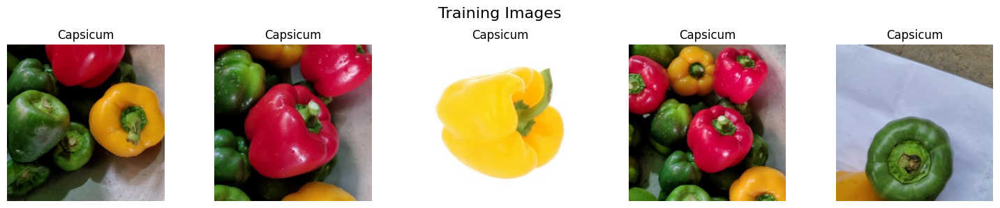

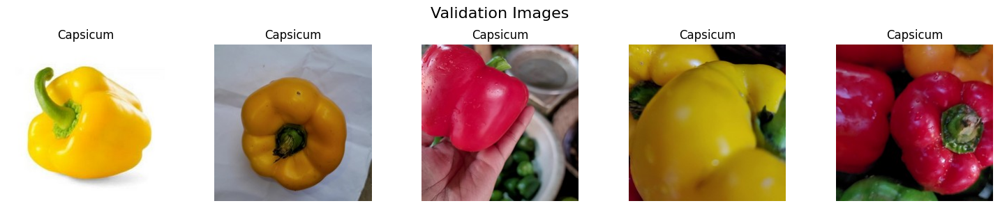

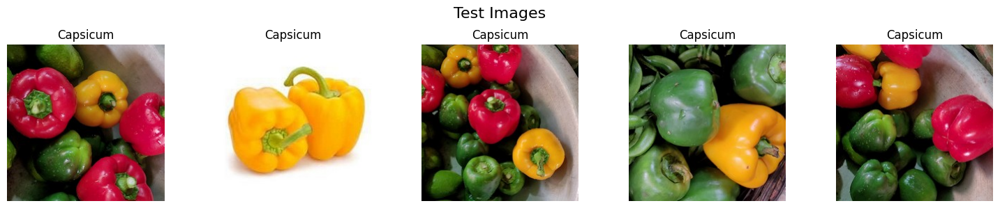

In [ ]:
# Definisikan class names dari folder dataset
class_names = os.listdir(train_path)
print("Class names:", class_names)

# Fungsi untuk menampilkan gambar dalam grid
def plot_images(images_arr, labels_arr, class_names, title):
    fig, axes = plt.subplots(1, 5, figsize=(15,3))
    fig.suptitle(title, fontsize=16)
    axes = axes.flatten()
    for img_path, lbl, ax in zip(images_arr, labels_arr, axes):
        img = Image.open(img_path)
        ax.imshow(img)
        ax.set_title(class_names[lbl])
        ax.axis('off')
    plt.tight_layout()
    plt.subplots_adjust(top=0.8)
    plt.show()

# Contoh gambar dan label dari set training
images_train = [os.path.join(train_path, class_name, img) for class_name in class_names for img in os.listdir(os.path.join(train_path, class_name))[:5]]
labels_train = [class_names.index(class_name) for class_name in class_names for _ in range(5)]
plot_images(images_train, labels_train, class_names, title='Training Images')

# Contoh gambar dan label dari set validation
images_val = [os.path.join(validation_path, class_name, img) for class_name in class_names for img in os.listdir(os.path.join(validation_path, class_name))[:5]]
labels_val = [class_names.index(class_name) for class_name in class_names for _ in range(5)]
plot_images(images_val, labels_val, class_names, title='Validation Images')

# Contoh gambar dan label dari set test
images_test = [os.path.join(test_path, class_name, img) for class_name in class_names for img in os.listdir(os.path.join(test_path, class_name))[:5]]
labels_test = [class_names.index(class_name) for class_name in class_names for _ in range(5)]
plot_images(images_test, labels_test, class_names, title='Test Images')


Gambar-gambar diatas telah berhasil dibagi ke dalam setnya masing-masing.

## **6. ANN Training**


Setelah melakukan preprocessing gambar, langkah berikutnya melibatkan training data menggunakan dua model yang berbeda: **sequential** dan **functional**.

- **Model Sequential**: Arsitektur sederhana di mana lapisan-lapisan ditumpuk secara linear, cocok untuk model-model yang lebih sederhana. Namun, model ini mungkin tidak dapat menangani arsitektur kompleks dengan multiple inputs/outputs atau skip connections.

- **Model Functional**: Menawarkan fleksibilitas lebih dengan mendefinisikan lapisan-lapisan sebagai objek terpisah dan menghubungkannya menggunakan functional API. Ini memungkinkan arsitektur kompleks dengan multiple inputs/outputs, sehingga cocok untuk tugas yang melibatkan skip connections.

Kedua model tersebut akan dilatih menggunakan data gambar yang telah diproses untuk mempelajari pola dan fitur yang diperlukan untuk klasifikasi yang akurat dari gambar sayuran ke dalam kelas masing-masing. Metode evaluasi utama yang digunakan adalah **accuracy** karena memberikan ukuran yang jelas tentang seberapa sering prediksi sesuai dengan label sebenarnya. **Accuracy** sangat penting untuk mengevaluasi efektivitas pengklasifikasi multikelas, karena langsung mencerminkan kemampuan model untuk mengidentifikasi setiap kelas dengan benar. Meskipun dataset tidak seimbang, ini akan ditangani menggunakan **class weights** untuk mencegah bias.

### **6.1 - Model Sequential**

Pertama, dimulai dengan mendefinisikan Model Sequential, kemudian dilanjutkan dengan training dan evaluasi.

#### **6.1.1 - Model Definition**

Bagian ini fokus untuk define model arsitektur.

In [ ]:
# Set random seed and clear any existing Keras session
seed = 20
tf.keras.backend.clear_session()
np.random.seed(seed)
tf.random.set_seed(seed)

**Explanation:**
- Menetapkan seed random untuk memastikan hasil eksperimen dapat direproduksi.
- Membersihkan sesi Keras untuk memastikan tidak ada model atau layer yang tertinggal dari sesi sebelumnya yang dapat mempengaruhi pelatihan model baru.

In [ ]:
# Create Sequential API model
model_seq = Sequential()

# Convolution Architechture
model_seq.add(Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)))
model_seq.add(MaxPooling2D((2, 2)))
model_seq.add(Conv2D(64, (3, 3), activation='relu'))
model_seq.add(MaxPooling2D((2, 2)))
model_seq.add(Conv2D(128, (3, 3), activation='relu'))
model_seq.add(MaxPooling2D((2, 2)))
model_seq.add(Conv2D(256, (3, 3), activation='relu'))
model_seq.add(MaxPooling2D((2, 2)))

# Architechture ANN biasa
model_seq.add(Flatten())
model_seq.add(Dropout(0.5))
model_seq.add(Dense(64, activation='relu'))
model_seq.add(Dense(5, activation='softmax'))

# Compile Model
model_seq.compile(loss='sparse_categorical_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])

# Menampilkan ringkasan model
model_seq.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2  (None, 111, 111, 32)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 109, 109, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 54, 54, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 52, 52, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 26, 26, 128)       0

**Explanation:**

- **Layer Conv2D:** Melakukan operasi konvolusi untuk mengekstrak fitur dari gambar input dengan filter berukuran 3x3 dan aktivasi ReLU.
- **Layer MaxPooling2D:** Menggunakan pooling berukuran 2x2 untuk mengurangi dimensi spasial dari output konvolusi sambil mempertahankan informasi penting.
- **Flatten:** Meratakan output dari layer konvolusi untuk dimasukkan ke dalam fully connected layer.
- **Dropout**: Menerapkan dropout dengan rate 50% untuk mencegah overfitting.
- **Dense**: Layer fully connected dengan 64 neuron dan aktivasi ReLU untuk menangkap hubungan non-linear.
- **Dense**: Layer output dengan 5 neuron dan aktivasi softmax untuk klasifikasi multi-kelas.
- Menggunakan **sparse_categorical_crossentropy** sebagai fungsi loss untuk klasifikasi multi-kelas.
- Menggunakan **optimizer adam** yang merupakan optimizer adaptif yang efisien.
- Metrik yang digunakan adalah **accuracy** untuk mengevaluasi performa model.

**Insight**
1. Arsitektur Konvolusi:

  - Model ini terdiri dari empat layer konvolusi berturut-turut yang masing-masing diikuti oleh layer max pooling.
  - Ukuran filter yang digunakan adalah 3x3 dengan jumlah filter meningkat secara bertahap (32, 64, 128, 256) untuk mengekstrak fitur yang lebih kompleks.
  - Layer konvolusi pertama memiliki input shape 224x224x3, yang menunjukkan gambar RGB.

2. Kompilasi dan Evaluasi:

  - Model dikompilasi dengan fungsi loss **sparse_categorical_crossentropy** dan **optimizer adam**.
  - Ringkasan model menunjukkan bahwa total parameter yang dapat dilatih adalah **2,748,101**, yang semuanya adalah p**arameter trainable.**

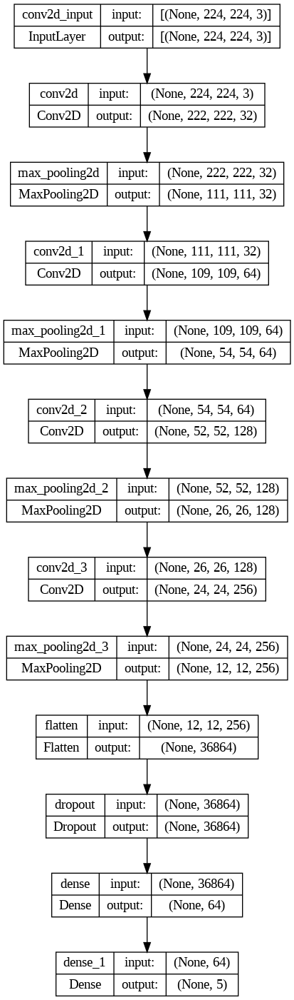

In [ ]:
# Plot layers

tf.keras.utils.plot_model(model_seq, show_shapes=True)

Plot layer model memberikan visualisasi dari arsitektur model yang telah dibuat, yang menguraikan struktur model sequential. Ini merinci bentuk masukan dan keluaran setiap layer, memberikan representasi visual yang jelas tentang bagaimana data diproses dan diubah di seluruh network.

Model ini menggunakan kombinasi dari layer konvolusi untuk mengekstrak fitur dari gambar, diikuti oleh layer fully connected untuk melakukan klasifikasi berdasarkan fitur yang telah diekstraksi. Setiap tahap konvolusi diikuti oleh max pooling untuk mengurangi dimensi dan **mengurangi overfitting**, sementara dropout digunakan untuk regularisasi. Model ini diakhiri dengan layer softmax untuk memberikan probabilitas dari setiap kelas dalam klasifikasi multi-kelas.

**Explanation:**

#### **6.1.2 - Model Training**

Setelah define model, model dilatih menggunakan traiin set dan divalidasi menggunakan validation set untuk meminimalkan kesalahan secara konsisten di setiap epoch.

Model dilatih menggunakan **train_generator** selama **20 epochs**, dengan **val_generator** digunakan untuk validasi di setiap epoch. Batch size yang digunakan adalah **32**.

In [ ]:
%%time

# Train the model

# Train the model dengan subset data
history_seq = model_seq.fit(train_generator,
                            epochs=20,
                            validation_data=val_generator,
                            batch_size=32)

Epoch 1/20
32/32 [==============================] - 58s 2s/step - loss: 1.2775 - accuracy: 0.4110 - val_loss: 1.7778 - val_accuracy: 0.2080
Epoch 2/20
32/32 [==============================] - 18s 571ms/step - loss: 0.7612 - accuracy: 0.6800 - val_loss: 2.3089 - val_accuracy: 0.2560
Epoch 3/20
32/32 [==============================] - 18s 576ms/step - loss: 0.6510 - accuracy: 0.7220 - val_loss: 2.4363 - val_accuracy: 0.2880
Epoch 4/20
32/32 [==============================] - 18s 558ms/step - loss: 0.6506 - accuracy: 0.7460 - val_loss: 1.8278 - val_accuracy: 0.3680
Epoch 5/20
32/32 [==============================] - 19s 599ms/step - loss: 0.5981 - accuracy: 0.7610 - val_loss: 4.6133 - val_accuracy: 0.3680
Epoch 6/20
32/32 [==============================] - 18s 555ms/step - loss: 0.5302 - accuracy: 0.7980 - val_loss: 2.6576 - val_accuracy: 0.4000
Epoch 7/20
32/32 [==============================] - 18s 564ms/step - loss: 0.4202 - accuracy: 0.8430 - val_loss: 3.1487 - val_accuracy: 0.4480
Ep

**Explanation:**

- Setiap epoch menampilkan **loss dan accuracy** untuk training dan validasi.
- Akurasi training meningkat dari **41.10%** hingga **94.10%.**
- Akurasi validasi juga mengalami peningkatan namun dengan fluktuasi, menunjukkan model mungkin mengalami overfitting.
- Total waktu komputasi untuk pelatihan model adalah sekitar **7 menit 26 detik** utnuk menyelesaikan running.

Hasilnya menunjukkan proses lengkap mulai dari setting random seed, membangun model, mengkompilasi, melatih, hingga memverifikasi hasil pelatihan. Model mencapai akurasi yang baik pada data training, namun akurasi validasi menunjukkan adanya potensi **overfitting**. Insight ini penting untuk analisis lebih lanjut dan perbaikan model.

#### **6.1.3 - Model Evaluation**

Dalam proses evaluasi model, kami mengevaluasi akurasi dan nilai loss untuk setiap set data: pelatihan, validasi, dan tes.

In [ ]:
# Evaluasi model pada data pelatihan, validasi, dan test
results_train_seq = model_seq.evaluate(train_generator, verbose=0)
print('train_acc:', results_train_seq[1])
print('train_loss:', results_train_seq[0])

results_val_seq = model_seq.evaluate(val_generator, verbose=0)
print('val_acc:', results_val_seq[1])
print('val_loss:', results_val_seq[0])

results_test_seq = model_seq.evaluate(test_generator, verbose=0)
print('test_acc:', results_test_seq[1])
print('test_loss:', results_test_seq[0])


train_acc: 0.9240000247955322
train_loss: 0.23355337977409363
val_acc: 0.3919999897480011
val_loss: 2.632047653198242
test_acc: 0.3919999897480011
test_loss: 2.8373794555664062


**Insight**

**1. Akurasi Tinggi pada Data Pelatihan:**

  - Akurasi pelatihan sebesar **92.40%** menunjukkan bahwa model mampu belajar dengan baik dari data pelatihan dan dapat mengklasifikasikan data pelatihan dengan benar.

**2. Akurasi Rendah pada Data Validasi dan Tes:**

  - Akurasi validasi dan tes hanya sebesar **39.19%**, yang menunjukkan model tidak berkinerja baik pada data yang belum dilihat sebelumnya. Hal ini menandakan adanya masalah overfitting, dimana model terlalu baik mempelajari data pelatihan namun gagal menggeneralisasi data baru.

**3. Nilai Loss Tinggi pada Data Validasi dan Tes:**

  - Nilai loss yang tinggi pada data validasi dan tes juga mengindikasikan masalah yang sama, yaitu **overfitting**. Model tidak mampu memprediksi dengan baik untuk data di luar data pelatihan.

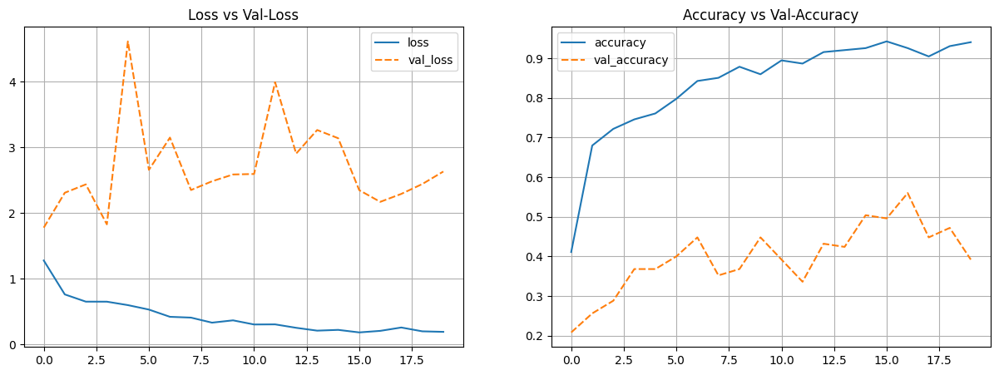

In [ ]:
# Model Evaluation

# Plot training results
history_seq_df = pd.DataFrame(history_seq.history)

plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
sns.lineplot(data=history_seq_df[['loss', 'val_loss']])
plt.grid()
plt.title('Loss vs Val-Loss')

plt.subplot(1, 2, 2)
sns.lineplot(data=history_seq_df[['accuracy', 'val_accuracy']])
plt.grid()
plt.title('Accuracy vs Val-Accuracy')
plt.show()

**Explanation:**

Bagan menunjukkan performa model sequential melalui fase train dan validasi. Sumbu X mewakili epoch, sedangkan sumbu y mewakili score.

- **Loss vs Val-Loss:**

  Grafik menunjukkan bahwa nilai loss pada data pelatihan terus menurun seiring dengan waktu, yang menandakan bahwa model sedang belajar. Namun, nilai loss pada data validasi cenderung tetap tinggi dan fluktuatif, yang menegaskan bahwa model mengalami overfitting.

- **Accuracy vs Val-Accuracy:**

  Grafik menunjukkan bahwa akurasi pada data pelatihan meningkat dengan baik, sedangkan akurasi pada data validasi tetap rendah dan fluktuatif, yang memperkuat indikasi overfitting.

Evaluasi model menunjukkan adanya **overfitting yang signifikan.** Model belajar dengan sangat baik pada data pelatihan namun gagal menggeneralisasi data baru dari set validasi dan tes. Hal ini mengindikasikan bahwa model mungkin terlalu kompleks atau jumlah data pelatihan tidak cukup beragam untuk menangkap variasi data yang lebih luas. Beberapa langkah yang bisa dilakukan untuk mengatasi masalah ini termasuk menggunakan lebih banyak data, mengurangi kompleksitas model, atau menerapkan regularisasi yang lebih kuat.









In [ ]:
# Check the performance of test-set

# Mendapatkan probabilitas prediksi
y_pred_prob_seq = model_seq.predict(test_generator)

# Mendapatkan kelas dengan probabilitas tertinggi
y_pred_class_seq = np.argmax(y_pred_prob_seq, axis=1)

# Mendapatkan label sebenarnya dari test set
y_true = test_generator.classes

# Mendapatkan nama kelas dari test set
class_names = list(train_generator.class_indices.keys())

# Menampilkan Classification Report
print(classification_report(y_true, y_pred_class_seq, target_names=class_names))


4/4 [==============================] - 1s 125ms/step
              precision    recall  f1-score   support

     Cabbage       0.00      0.00      0.00        25
    Capsicum       0.60      0.60      0.60        25
      Carrot       0.00      0.00      0.00        25
 Cauliflower       0.39      0.88      0.54        25
     Pumpkin       0.28      0.48      0.35        25

    accuracy                           0.39       125
   macro avg       0.25      0.39      0.30       125
weighted avg       0.25      0.39      0.30       125



**Insight**:
- Precision, recall, dan f1-score untuk setiap kelas bervariasi dengan kinerja terbaik pada kelas `"Capsicum"` dan kinerja terburuk pada kelas `"Cabbage"` yang memiliki nilai precision dan recall 0.
- Akurasi keseluruhan model pada data pengujian adalah 39%, yang menunjukkan bahwa **model kurang efektif dalam mengklasifikasikan gambar di dataset pengujian**.

Model klasifikasi mencapai akurasi keseluruhan **39%** di 125 kasus. Dari hasil ini, kita dapat melihat bahwa model memiliki akurasi tinggi pada data pelatihan, tetapi performa model menurun pada data validasi dan data pengujian. Hal ini mengindikasikan bahwa model mengalami **overfitting**, yaitu model terlalu menyesuaikan dengan data pelatihan sehingga tidak dapat menggeneralisasi dengan baik pada data yang tidak terlihat sebelumnya.

**Explanation:**

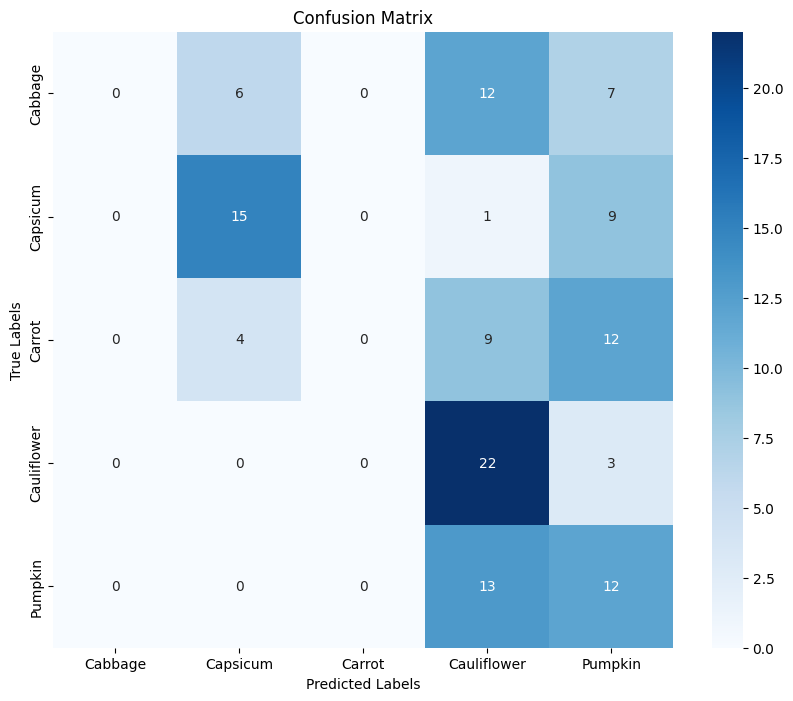

In [ ]:

# Generate the confusion matrix
cm_seq = confusion_matrix(y_true, y_pred_class_seq)

# Plot the confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm_seq, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

**Explanation:**

Confusion matrix menunjukkan jumlah prediksi benar dan salah untuk setiap kelas.
- Terlihat bahwa model mengalami kesulitan dalam mengklasifikasikan kelas `"Cabbage"` dengan benar, di mana banyak gambar "Cabbage" diklasifikasikan sebagai `"Cauliflower"`.
- Kelas "Capsicum" memiliki performa terbaik dengan 15 prediksi benar dari 25 gambar.
- Kelas "Cauliflower" juga menunjukkan performa yang lumayan baik dengan 22 prediksi benar dari 25 gambar.

Dari hasil evaluasi dan analisis ini, dapat disimpulkan bahwa model memiliki performa yang baik pada data pelatihan tetapi tidak dapat menggeneralisasi dengan baik pada data validasi dan pengujian, yang ditunjukkan oleh perbedaan yang signifikan antara akurasi pelatihan dan validasi/pengujian serta tingginya nilai loss pada data validasi dan pengujian. Hal ini menunjukkan adanya overfitting yang perlu diatasi.

### **6.2 - Model Functional**

Performa model sequential masih kurang memuaskan. Selanjutnya model akan diimplementasikan dengan menggunakan pendekatan Functional.

#### **6.2.1 - Model Definition**


Bagian ini berfokus pada pendefinisian arsitektur model.

In [ ]:
# Set random seed and clear any existing Keras session
seed = 20
tf.keras.backend.clear_session()
np.random.seed(seed)
tf.random.set_seed(seed)

In [ ]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Flatten, Dense, Dropout, Concatenate
import tensorflow as tf

# Define the input layer
input_layer = Input(shape=(224, 224, 3))

# Convolutional Architecture
# First Conv Block
layer1 = Conv2D(32, (3, 3), activation='relu')(input_layer)
layer1 = MaxPooling2D((2, 2))(layer1)

# Second Conv Block
layer2 = Conv2D(64, (3, 3), activation='relu')(layer1)
layer2 = MaxPooling2D((2, 2))(layer2)

# Resize layer2 to match the shape of layer1
layer2_resized = tf.image.resize(layer2, (layer1.shape[1], layer1.shape[2]))

# Concatenate the resized layer2 with layer1
concat_layer = Concatenate()([layer1, layer2_resized])

# Third Conv Block
layer3 = Conv2D(128, (3, 3), activation='relu')(concat_layer)
layer3 = MaxPooling2D((2, 2))(layer3)

# Fourth Conv Block
layer4 = Conv2D(256, (3, 3), activation='relu')(layer3)
layer4 = MaxPooling2D((2, 2))(layer4)

# ANN Layers
flattened = Flatten()(layer4)
dropout = Dropout(0.5)(flattened)
dense1 = Dense(512, activation='relu')(dropout)
output = Dense(5, activation='softmax')(dense1)

# Create the model
model_func = Model(inputs=input_layer, outputs=output)

# Compile the model
model_func.compile(loss='sparse_categorical_crossentropy',
                   optimizer='adam',
                   metrics=['accuracy'])

# Display model summary
model_func.summary()


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 222, 222, 32)         896       ['input_1[0][0]']             
                                                                                                  
 max_pooling2d (MaxPooling2  (None, 111, 111, 32)         0         ['conv2d[0][0]']              
 D)                                                                                               
                                                                                                  
 conv2d_1 (Conv2D)           (None, 109, 109, 64)         18496     ['max_pooling2d[0][0]']   

**Explanation:**

Model ini memiliki arsitektur yang lebih kompleks dengan menggunakan **layer Concatenate** untuk menggabungkan output dari dua layer konvolusi yang berbeda ukuran.

- Input Layer: Model dimulai dengan layer input yang menerima gambar dengan ukuran 224x224 piksel dan 3 channel warna (RGB).
- Resize Layer: Layer ini digunakan untuk menyesuaikan ukuran layer sebelum dilakukan concatenation.
- Concatenate: Layer ini menggabungkan dua tensor yang berbeda menjadi satu tensor.
- Layer Convolutional dan Pooling: Sama seperti model Sequential, layer ini digunakan untuk mengekstrak fitur dari gambar.
- ANN Layers: Menggunakan Flatten, Dropout, dan Dense untuk melakukan klasifikasi.
- Model dikompilasi menggunakan sparse_categorical_crossentropy sebagai loss function, optimizer Adam, dan metrik akurasi untuk evaluasi.


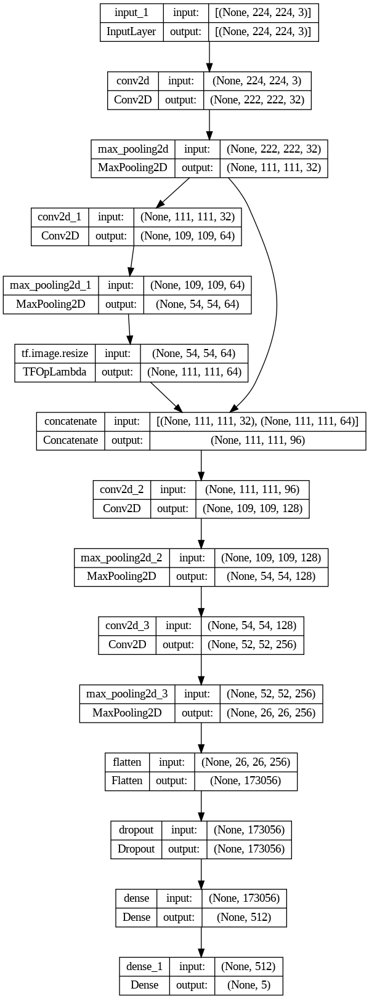

In [ ]:
# Plot layers
tf.keras.utils.plot_model(model_func, show_shapes=True)

Gambar di atas menampilkan diagram arsitektur model, yang menguraikan struktur model functional.

#### **6.2.2 - Model Training**

Setelah menentukan model, model dilatih ulang menggunakan set pelatihan dan divalidasi dengan set validasi untuk secara konsisten mengurangi kesalahan di setiap periode.

Model siap untuk pelatihan menggunakan 20 epoch, menggunakan set data pelatihan dan validasi.

In [ ]:
%%time


# Train the model dengan subset data
history_func = model_func.fit(train_generator,
                            epochs=20,
                            validation_data=val_generator,
                            batch_size=32)

Epoch 1/20
32/32 [==============================] - 31s 749ms/step - loss: 1.4340 - accuracy: 0.5320 - val_loss: 1.6211 - val_accuracy: 0.3520
Epoch 2/20
32/32 [==============================] - 18s 573ms/step - loss: 0.6162 - accuracy: 0.7530 - val_loss: 2.6684 - val_accuracy: 0.4320
Epoch 3/20
32/32 [==============================] - 20s 620ms/step - loss: 0.5226 - accuracy: 0.7910 - val_loss: 1.9802 - val_accuracy: 0.4320
Epoch 4/20
32/32 [==============================] - 18s 576ms/step - loss: 0.4896 - accuracy: 0.8160 - val_loss: 1.9401 - val_accuracy: 0.4480
Epoch 5/20
32/32 [==============================] - 19s 582ms/step - loss: 0.3969 - accuracy: 0.8550 - val_loss: 2.5361 - val_accuracy: 0.4000
Epoch 6/20
32/32 [==============================] - 20s 609ms/step - loss: 0.3813 - accuracy: 0.8640 - val_loss: 1.6414 - val_accuracy: 0.5520
Epoch 7/20
32/32 [==============================] - 18s 565ms/step - loss: 0.3099 - accuracy: 0.8900 - val_loss: 2.0042 - val_accuracy: 0.4800

**Explanation:**

Proses pelatihan model dilakukan selama 20 epoch, dengan waktu penyelesaian sekitar **6 menit 19 detik**. Skor terakhir yang dicapai oleh model adalah sebagai berikut:

- Training Loss: 0.1364
- Training Accuracy: 0.9550
- Validation Loss: 3.1926
- Validation Accuracy: 0.4400

Dibandingkan dengan model sebelumnya, model ini menunjukkan peningkatan akurasi pada data pelatihan, mencapai lebih dari 95%. Namun, terdapat indikasi overfitting yang signifikan, ditandai dengan perbedaan yang mencolok antara akurasi pada data pelatihan dan data validasi. Meskipun model memiliki performa yang sangat baik pada data pelatihan, kemampuannya untuk menggeneralisasi pada data yang tidak dilatih masih terbatas.

#### **6.2.3 - Model Evaluation**

Sama seperti sebelumnya, model yang dilatih kemudian dievaluasi menggunakan tiga metode: menilai **training and validation loss and accuracy**, menghasilkan **classification reports** dan **confusion matrix** untuk set pengujian.

In [ ]:
# Evaluasi model Functional pada data pelatihan, validasi, dan pengujian
results_train_func = model_func.evaluate(train_generator, verbose=0)
print('train_acc:', results_train_func[1])
print('train_loss:', results_train_func[0])

results_val_func = model_func.evaluate(val_generator, verbose=0)
print('val_acc:', results_val_func[1])
print('val_loss:', results_val_func[0])

results_test_func = model_func.evaluate(test_generator, verbose=0)
print('test_acc:', results_test_func[1])
print('test_loss:', results_test_func[0])


train_acc: 0.968999981880188
train_loss: 0.1134672686457634
val_acc: 0.4399999976158142
val_loss: 3.1925570964813232
test_acc: 0.46399998664855957
test_loss: 3.330270528793335


**Explanation:**

Hasil evaluasi menunjukkan akurasi dan loss dari model pada data pelatihan, validasi, dan pengujian.

- **train_acc**:**0.968, train_loss: 0.113** menunjukkan bahwa model performa sangat baik pada data pelatihan.
- **val_acc**: **0.439, val_loss: 3.192** menunjukkan bahwa model kurang baik dalam generalisasi pada data validasi, namun sedikit lebih baik dibandingkan model Sequential.
- **test_acc**: **0.463, test_loss: 3.330** menunjukkan performa yang sedikit lebih baik dibandingkan dengan model Sequential pada data uji.

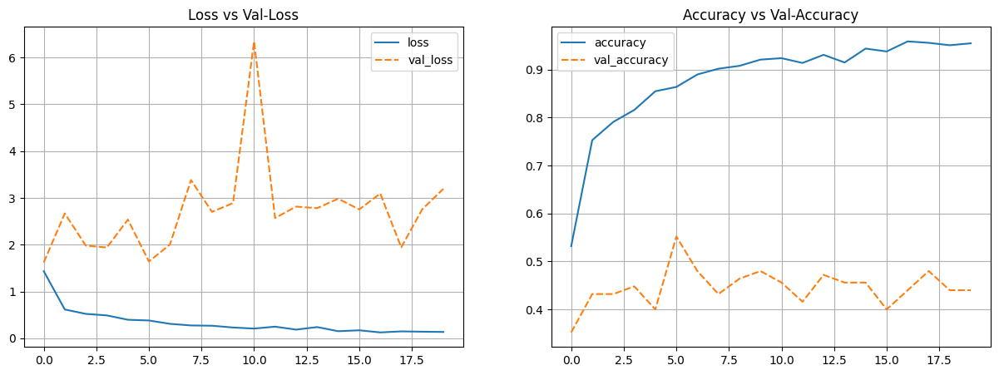

In [ ]:
# Model Evaluation

# Plot training results
history_func_df = pd.DataFrame(history_func.history)

plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
sns.lineplot(data=history_func_df[['loss', 'val_loss']])
plt.grid()
plt.title('Loss vs Val-Loss')

plt.subplot(1, 2, 2)
sns.lineplot(data=history_func_df[['accuracy', 'val_accuracy']])
plt.grid()
plt.title('Accuracy vs Val-Accuracy')
plt.show()

**Explanation:**

- **Grafik Loss vs Val-Loss** menunjukkan bahwa val_loss lebih fluktuatif dan lebih tinggi dibandingkan dengan loss pada data pelatihan.
- **Grafik Accuracy vs Val-Accurac**y menunjukkan akurasi pada data pelatihan meningkat secara konsisten, namun akurasi pada data validasi tidak stabil dan lebih rendah dibandingkan akurasi pada data pelatihan.

In [ ]:
# Check the performance of test-set

# Mendapatkan probabilitas prediksi
y_pred_prob_func = model_func.predict(test_generator)

# Mendapatkan kelas dengan probabilitas tertinggi
y_pred_class_func = np.argmax(y_pred_prob_func, axis=1)

# Mendapatkan label sebenarnya dari test set
y_true_func = test_generator.classes

# Mendapatkan nama kelas dari test set
class_names_func = list(train_generator.class_indices.keys())

# Menampilkan Classification Report
print(classification_report(y_true_func, y_pred_class_func, target_names=class_names_func))


4/4 [==============================] - 1s 132ms/step
              precision    recall  f1-score   support

     Cabbage       0.47      0.32      0.38        25
    Capsicum       0.81      0.68      0.74        25
      Carrot       0.00      0.00      0.00        25
 Cauliflower       0.32      0.96      0.48        25
     Pumpkin       0.69      0.36      0.47        25

    accuracy                           0.46       125
   macro avg       0.46      0.46      0.42       125
weighted avg       0.46      0.46      0.42       125



**Insight**:

- Capsicum memiliki performa terbaik dengan precision 0.81 dan F1-score 0.74, menunjukkan bahwa model dapat mengidentifikasi kelas ini dengan cukup baik dibandingkan kelas lainnya.
- Carrot menunjukkan performa terburuk dengan precision, recall, dan F1-score semuanya 0. Hal ini menunjukkan bahwa model gagal mengenali atau mengklasifikasikan gambar kelas Carrot.
- Cauliflower memiliki recall yang sangat tinggi (0.96) tetapi precision yang rendah (0.32). Hal ini menunjukkan bahwa model dapat mendeteksi hampir semua instance Cauliflower, tetapi banyak dari prediksi tersebut yang salah.
- Pumpkin memiliki precision yang cukup baik (0.69) namun recall yang rendah (0.36), menunjukkan bahwa model cenderung mengidentifikasi beberapa instance Pumpkin dengan benar tetapi banyak yang terlewatkan.
- Cabbage memiliki performa yang sedang dengan F1-score 0.38, menunjukkan keseimbangan yang kurang baik antara precision dan recall.
- Akurasi Keseluruhan (0.46) menunjukkan bahwa model ini tidak memiliki performa yang baik secara keseluruhan, yang dikonfirmasi oleh macro dan weighted average yang menunjukkan nilai di sekitar 0.42-0.46.


Model ini menunjukkan performa yang beragam tergantung pada kelas yang diklasifikasikan, dengan performa terbaik pada kelas Capsicum dan performa terburuk pada kelas Carrot. Hal ini menunjukkan bahwa model memerlukan peningkatan lebih lanjut, seperti lebih banyak data pelatihan, perbaikan dalam teknik augmentasi data, atau penyesuaian arsitektur model untuk meningkatkan akurasi dan kemampuan generalisasi pada seluruh kelas.

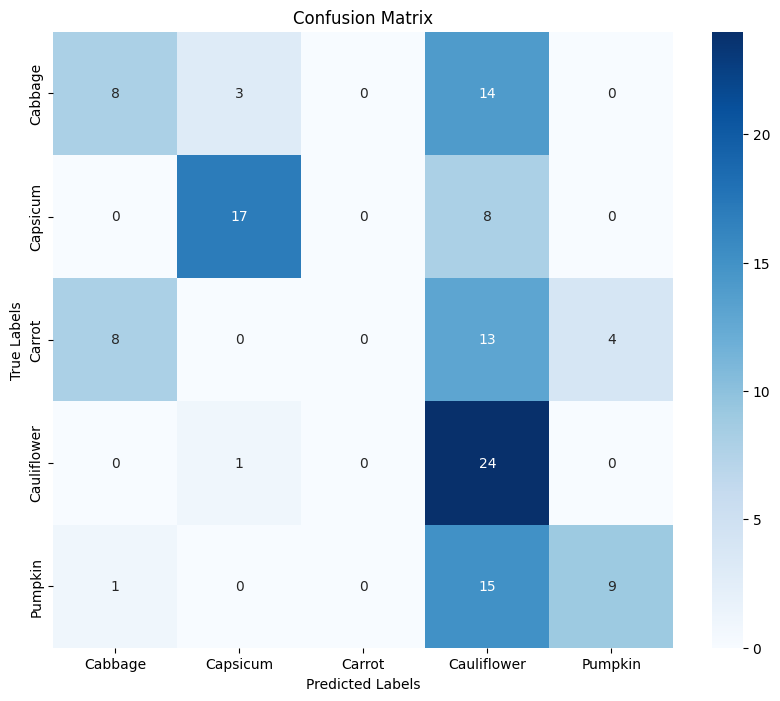

In [ ]:

# Generate the confusion matrix
cm_func = confusion_matrix(y_true, y_pred_class_func)

# Plot the confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm_func, annot=True, fmt='d', cmap='Blues', xticklabels=class_names_func, yticklabels=class_names_func)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

**Explanation:**

Confusion matrix menunjukkan bahwa model functional memiliki performa yang lebih baik dalam memprediksi kelas **Cauliflower**, namun masih bingung antara kelas Cauliflower dan kelas lainnya. Prediksi untuk kelas Carrot juga menunjukkan performa yang kurang baik.

**Kesimpulan Sequential API dan Functional API**

Kedua model menunjukkan tren overfitting dimana performa pada data pelatihan sangat baik namun performa pada data validasi dan pengujian menurun. Model Functional menunjukkan sedikit perbaikan dalam akurasi validasi dan pengujian dibandingkan model Sequential. Augmentasi data dan tuning hyperparameter dapat dipertimbangkan untuk memperbaiki generalisasi model pada data validasi dan pengujian.

## **7. ANN Improvement with Transfer Learning**


Untuk meningkatkan hasil model klasifikasi yang kurang memuaskan, dilakukan peningkatan model menggunakan teknik transfer learning dengan **model VGG16** dan perbaikan augmentasi data

Dengan penerapan transfer learning menggunakan model VGG16 dan augmentasi data yang lebih komprehensif, diharapkan performa model akan meningkat. Transfer learning memungkinkan model untuk memanfaatkan fitur-fitur yang telah dipelajari oleh model pretrained, sementara augmentasi data yang lebih bervariasi membantu model menjadi lebih robust dan mengurangi risiko overfitting.

#### **7.1 - Pre-processing Improved Data Augmentation**

In [ ]:
# Define ImageDataGenerators with additional augmentations
train_datagen_improved = ImageDataGenerator(rescale=1./255,
                                            rotation_range=40,
                                            width_shift_range=0.2,
                                            height_shift_range=0.2,
                                            shear_range=0.1,
                                            zoom_range=0.2,
                                            vertical_flip=True,
                                            brightness_range=[0.8, 1.2],
                                            preprocessing_function=preprocessing_denoise
                                            )

# Validation and test generators do not need augmentation
val_test_datagen_improved = ImageDataGenerator(rescale=1./255)

# Create generators
train_generator_improved = train_datagen_improved.flow_from_directory(train_path,
                                                                      target_size=(224, 224),
                                                                      batch_size=batch_size,
                                                                      class_mode='sparse')

val_generator_improved = val_test_datagen_improved.flow_from_directory(validation_path,
                                                                       target_size=(224, 224),
                                                                       batch_size=batch_size,
                                                                       class_mode='sparse',
                                                                       shuffle=False)

test_generator_improved = val_test_datagen_improved.flow_from_directory(test_path,
                                                                        target_size=(224, 224),
                                                                        batch_size=batch_size,
                                                                        class_mode='sparse',
                                                                        shuffle=False)

# Verifikasi jumlah gambar di setiap set
print("Train Data: ", train_generator_improved.samples)
print("Validation Data: ", val_generator_improved.samples)
print("Test Data: ", test_generator_improved.samples)

Found 1000 images belonging to 5 classes.
Found 125 images belonging to 5 classes.
Found 125 images belonging to 5 classes.
Train Data:  1000
Validation Data:  125
Test Data:  125


Augmentasi data digunakan untuk meningkatkan variasi dan jumlah data pelatihan sehingga model menjadi lebih robust dan menghindari overfitting. Teknik augmentasi yang digunakan di sini lebih bervariasi dibandingkan sebelumnya:

1. Rotation: Memutar gambar hingga 40 derajat untuk membantu model mengenali objek dari berbagai sudut.
2. Width Shift: Menggeser gambar secara horizontal hingga 20% dari lebar gambar.
3. Height Shift: Menggeser gambar secara vertikal hingga 20% dari tinggi gambar.
4. Shear: Menggeser gambar secara diagonal untuk menambah variasi.
5. Zoom: Memperbesar atau memperkecil gambar hingga 20%.
6. Vertical Flip: Membalik gambar secara vertikal.
7. Brightness Range: Mengubah kecerahan gambar dalam rentang 80% hingga 120%.
8. Preprocessing Function: Menerapkan fungsi preprocessing khusus, yaitu preprocessing_denoise, untuk mengurangi noise pada gambar.

### **7.2 - Transfer Learning with Sequential API**

**Pre-Processing**

Alasan menggunakan model ini karena VGG16 dikenal **stabil** dan memiliki **performa yang baik** dalam berbagai tugas klasifikasi gambar. Penggunaan model ini dapat membantu mencapai hasil yang baik dengan waktu pelatihan yang lebih singkat dibandingkan melatih model dari awal.

In [ ]:

# Load the pre-trained VGG16 model without the top layer
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the base model
base_model.trainable = False


58889256/58889256 [==============================] - 0s 0us/step


Model telah berhasil diunduh dan dikonfigurasi dengan bentuk input yang sesuai.

**Model Definition**

In [ ]:
# Set random seed and clear any existing Keras session
seed = 20
tf.keras.backend.clear_session()
np.random.seed(seed)
tf.random.set_seed(seed)

- Seed diatur untuk memastikan reproduktibilitas hasil. Dengan mengatur seed untuk Numpy dan TensorFlow, model akan menghasilkan hasil yang konsisten setiap kali dijalankan.
- Sesi Keras yang ada dibersihkan untuk menghindari konflik dengan model sebelumnya yang mungkin masih ada di memori.

In [ ]:
# Create transfer learning model

# Sequential API
model_seq_transfer_improved = Sequential()
model_seq_transfer_improved.add(base_model)
model_seq_transfer_improved.add(Flatten())
model_seq_transfer_improved.add(BatchNormalization())
model_seq_transfer_improved.add(Dense(512, activation='relu'))
model_seq_transfer_improved.add(Dropout(0.5))
model_seq_transfer_improved.add(Dense(5, activation='softmax'))

# Compile the model
model_seq_transfer_improved.compile(optimizer=Adam(learning_rate=0.0001),
                                    loss='sparse_categorical_crossentropy',
                                    metrics=['accuracy'])

# Display model summary
model_seq_transfer_improved.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 flatten (Flatten)           (None, 25088)             0         
                                                                 
 batch_normalization (Batch  (None, 25088)             100352    
 Normalization)                                                  
                                                                 
 dense (Dense)               (None, 512)               12845568  
                                                                 
 dropout (Dropout)           (None, 512)               0         
                                                                 
 dense_1 (Dense)             (None, 5)                 2565      
                                                        

**Explanation:**

**Pembuatan Model Transfer Learning:**

- Sequential API: Model dibuat menggunakan API Sequential Keras.
Base Model (VGG16): Model dasar VGG16 dimuat dengan bobot yang telah dilatih sebelumnya pada dataset ImageNet, dan lapisan atas tidak disertakan. Semua lapisan dalam base model dibekukan (tidak dapat dilatih) agar fitur-fitur yang sudah dipelajari tidak diubah.
- Flatten Layer: Menambahkan lapisan Flatten untuk mengubah output dari base model menjadi vektor 1D.
- Batch Normalization: Menambahkan lapisan Batch Normalization untuk menstabilkan dan mempercepat pelatihan dengan menormalkan input dari lapisan sebelumnya.
- Dense Layer: Menambahkan lapisan Dense dengan 512 unit dan aktivasi ReLU untuk menambah kemampuan representasi model.
- Dropout Layer: Menambahkan lapisan Dropout dengan tingkat dropout 0.5 untuk mencegah overfitting dengan secara acak mengabaikan 50% unit selama pelatihan.
- Output Layer: Menambahkan lapisan Dense dengan 5 unit dan aktivasi Softmax untuk klasifikasi multi-class.

Ringkasan model menunjukkan total parameter dalam model, termasuk parameter yang dapat dilatih (trainable) dan tidak dapat dilatih (non-trainable).
- Total params: 27,663,173 (sekitar 105.53 MB)
- Trainable params: 1,289,809 (sekitar 49.20 MB)
- Non-trainable params: 14,746,464 (sekitar 56.32 MB)

**Insight:**

Model ini memanfaatkan kemampuan VGG16 yang sudah terlatih pada dataset besar untuk mengekstraksi fitur-fitur penting dari gambar. Dengan menambahkan beberapa lapisan dense dan dropout, model dapat disesuaikan untuk tugas spesifik kita dengan risiko overfitting yang lebih rendah. Ini adalah strategi yang efektif untuk mencapai hasil yang baik dengan dataset yang relatif lebih kecil dibandingkan dengan melatih model dari awal.

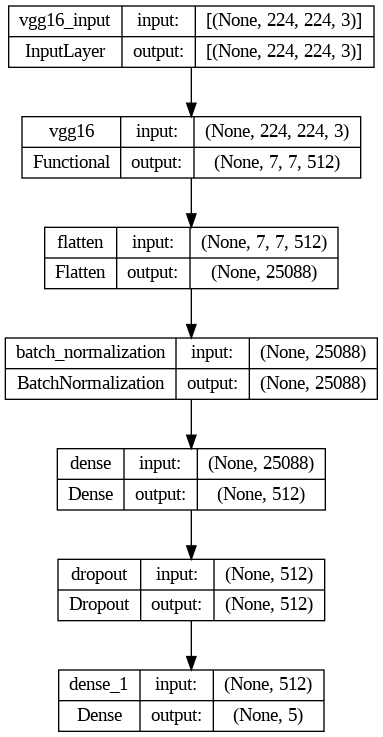

In [ ]:
# Plot layers
tf.keras.utils.plot_model(model_seq_transfer_improved, show_shapes=True)


Diagram di atas menggambarkan arsitektur model pembelajaran transfer, memberikan gambaran umum tentang struktur dan komponennya.

**Model Training**

In [ ]:

# Create function to schedule learning rate
def lr_schedule(epoch, lr):
    initial_lr = 0.001
    if epoch < 10:
        return initial_lr
    else:
        return initial_lr * math.exp(-0.1 * (epoch - 10))

# Define the learning rate scheduler callback
lr_scheduler = LearningRateScheduler(lr_schedule, verbose=1)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5)

# Define callbacks to perform early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)


**Explanation:**

- Fungsi **lr_schedule** digunakan untuk menjadwalkan perubahan learning rate selama pelatihan. Awalnya, learning rate diatur ke 0.001. Jika epoch kurang dari 10, learning rate tetap di 0.001. Setelah epoch 10, learning rate akan menurun secara eksponensial.
- **reduce_lr** adalah callback ReduceLROnPlateau yang memantau val_loss dan akan mengurangi learning rate sebesar faktor 0.2 jika val_loss tidak membaik dalam 5 epoch.

Implementasi ini bertujuan untuk mengoptimalkan proses pelatihan dengan menyesuaikan learning rate secara dinamis dan mencegah overfitting melalui **early stopping**.



In [ ]:

# Train the model
history_seq_transfer = model_seq_transfer_improved.fit(train_generator_improved,
                                                       epochs=25,
                                                       validation_data=val_generator_improved,
                                                       callbacks=[early_stopping, lr_scheduler, reduce_lr]
                                                       )



Epoch 1: LearningRateScheduler setting learning rate to 0.001.
Epoch 1/25
32/32 [==============================] - 40s 983ms/step - loss: 1.5451 - accuracy: 0.7900 - val_loss: 5.0299 - val_accuracy: 0.6080 - lr: 0.0010

Epoch 2: LearningRateScheduler setting learning rate to 0.001.
Epoch 2/25
32/32 [==============================] - 22s 680ms/step - loss: 0.7211 - accuracy: 0.9160 - val_loss: 6.5419 - val_accuracy: 0.5760 - lr: 0.0010

Epoch 3: LearningRateScheduler setting learning rate to 0.001.
Epoch 3/25
32/32 [==============================] - 20s 637ms/step - loss: 0.6569 - accuracy: 0.9270 - val_loss: 4.5348 - val_accuracy: 0.6720 - lr: 0.0010

Epoch 4: LearningRateScheduler setting learning rate to 0.001.
Epoch 4/25
32/32 [==============================] - 22s 698ms/step - loss: 0.8131 - accuracy: 0.9380 - val_loss: 2.7797 - val_accuracy: 0.8000 - lr: 0.0010

Epoch 5: LearningRateScheduler setting learning rate to 0.001.
Epoch 5/25
32/32 [==============================] - 20s 

**Explanation:**

- Dari hasil ini terlihat bahwa meskipun akurasi validasi cukup tinggi, nilai loss validasi menunjukkan fluktuasi yang besar dan kadang masih cukup tinggi. Ini menunjukkan adanya indikasi overfitting di mana model mungkin terlalu cocok dengan data pelatihan tetapi tidak generalisasi dengan baik pada data validasi.

- Peningkatan Akurasi: Implementasi transfer learning dan augmentasi data yang ditingkatkan secara signifikan meningkatkan akurasi validasi dari model sebelumnya. Ini menunjukkan bahwa penggunaan model pre-trained seperti VGG16 dan strategi augmentasi yang lebih baik dapat meningkatkan performa model.

Secara keseluruhan, hasil pelatihan menunjukkan peningkatan yang baik dalam akurasi, tetapi masih terdapat ruang untuk perbaikan lebih lanjut untuk mengatasi masalah overfitting.

**Model Evaluation**

In [ ]:
# Evaluate the model on training, validation, dan test data
results_train_improved = model_seq_transfer_improved.evaluate(train_generator_improved, verbose=0)
results_val_improved = model_seq_transfer_improved.evaluate(val_generator_improved, verbose=0)
results_test_improved = model_seq_transfer_improved.evaluate(test_generator_improved, verbose=0)

# Display
print(f"Train accuracy: {results_train_improved[1]:.4f} Train loss: {results_train_improved[0]:.4f}")
print(f"Validation accuracy: {results_val_improved[1]:.4f} Validation loss: {results_val_improved[0]:.4f}")
print(f"Test accuracy: {results_test_improved[1]:.4f} Test loss: {results_test_improved[0]:.4f}")



Train accuracy: 0.9530 Train loss: 0.2806
Validation accuracy: 0.8560 Validation loss: 1.4994
Test accuracy: 0.8640 Test loss: 0.8541


Evaluasi model setelah dilakukan transfer learning dan peningkatan augmentasi menunjukkan hasil yang sangat baik.

Hasil ini menunjukkan bahwa model memiliki kinerja yang sangat baik pada data pelatihan dan cukup baik pada data validasi dan pengujian. Perbedaan yang kecil antara akurasi validasi dan pengujian menunjukkan bahwa model ini mampu melakukan generalisasi dengan baik pada data yang tidak terlihat sebelumnya. Peningkatan augmentasi data dan penggunaan transfer learning dengan model VGG16 terbukti efektif dalam meningkatkan performa model.

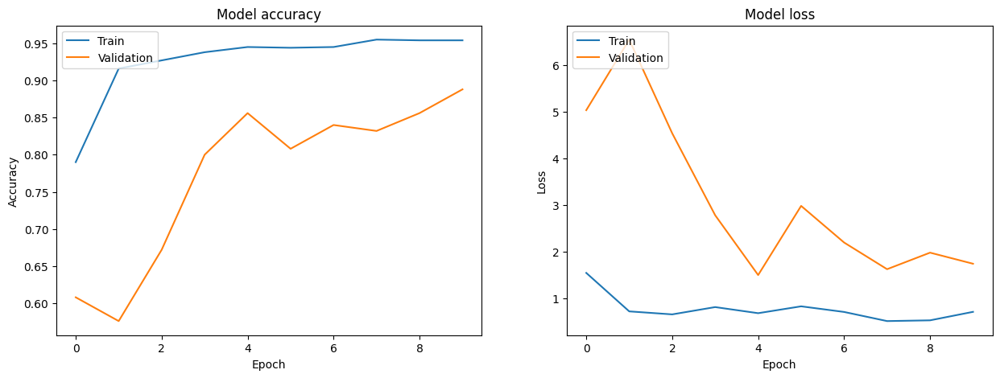

In [ ]:
# Plot training & validation accuracy values
plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
plt.plot(history_seq_transfer.history['accuracy'])
plt.plot(history_seq_transfer.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values
plt.subplot(1, 2, 2)
plt.plot(history_seq_transfer.history['loss'])
plt.plot(history_seq_transfer.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

**Explanation:**


Grafik di atas menunjukkan perbandingan akurasi dan loss antara data pelatihan dan validasi selama proses training. Berikut insight singkatnya:

- **Akurasi Model**: Grafik akurasi menunjukkan bahwa akurasi data pelatihan mencapai sekitar **95%**, sementara akurasi validasi mencapai sekitar **86%.** Akurasi validasi meningkat seiring berjalannya epoch, menunjukkan bahwa model berhasil belajar dari data pelatihan dan menggeneralisasi dengan baik pada data validasi.

- **Loss Model**: Grafik loss menunjukkan bahwa loss pada data pelatihan stabil dan rendah, sementara loss pada data validasi menurun signifikan dari awal hingga pertengahan epoch dan kemudian cenderung stabil. Ini menunjukkan bahwa model mengalami penurunan error pada data validasi, meskipun ada sedikit fluktuasi.

Secara keseluruhan, model menunjukkan performa yang baik dengan peningkatan akurasi dan penurunan loss pada data validasi, menandakan bahwa model mampu mengeneralisasi dengan baik pada data yang tidak terlihat sebelumnya.

In [ ]:
# Check the performance of test-set for Sequential Model
y_pred_prob_test3 = model_seq_transfer_improved.predict(test_generator_improved)
y_pred_class_test3 = np.argmax(y_pred_prob_test3, axis=1)
y_true_test3 = test_generator_improved.classes
class_names_seq = list(train_generator_improved.class_indices.keys())

# Display Classification Report for Sequential Model
print("Sequential Model - Classification Report - Test Data")
print(classification_report(y_true_test3, y_pred_class_test3, target_names=class_names_seq))


4/4 [==============================] - 1s 145ms/step
Sequential Model - Classification Report - Test Data
              precision    recall  f1-score   support

     Cabbage       0.77      0.96      0.86        25
    Capsicum       1.00      0.92      0.96        25
      Carrot       0.94      0.60      0.73        25
 Cauliflower       0.92      0.92      0.92        25
     Pumpkin       0.77      0.92      0.84        25

    accuracy                           0.86       125
   macro avg       0.88      0.86      0.86       125
weighted avg       0.88      0.86      0.86       125



Model mencapai akurasi keseluruhan sebesar **86%** pada data uji.

Model ini menunjukkan performa yang baik dengan f1-score rata-rata yang tinggi di semua kelas. Akurasi tinggi dan distribusi yang baik pada precision dan recall menunjukkan bahwa model telah berhasil melakukan generalisasi dengan baik pada data yang tidak terlihat.


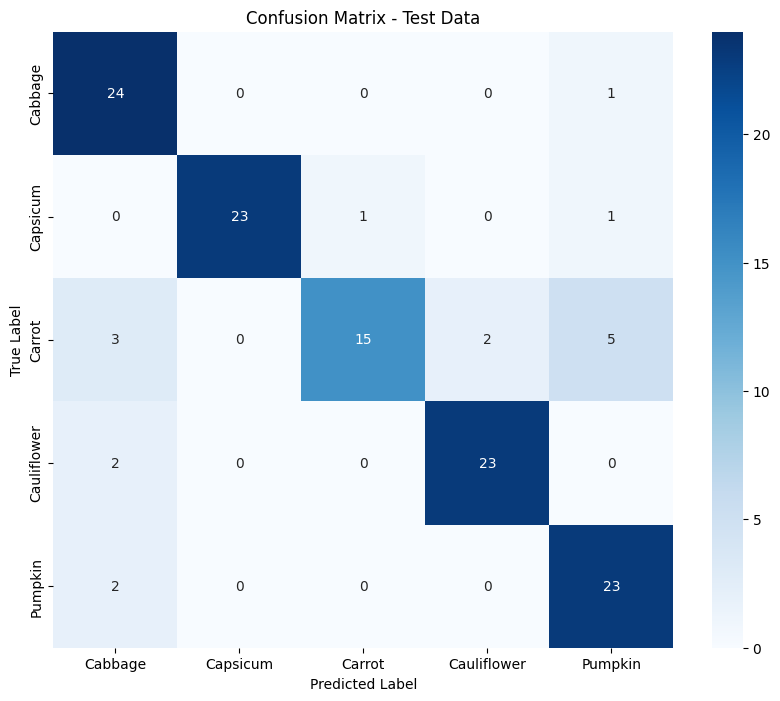

In [ ]:

# Generate the confusion matrices
cm_test3 = confusion_matrix(y_true_test3, y_pred_class_test3)

# Plot confusion matrix for the test data
plt.figure(figsize=(10, 8))
sns.heatmap(cm_test3, annot=True, fmt='d', cmap='Blues', xticklabels=class_names_seq, yticklabels=class_names_seq)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix - Test Data')
plt.show()


**Explanation:**

Matriks kebingungan (confusion matrix) untuk data uji menunjukkan hasil sebagai berikut:

- Kelas Cabbage: 24 dari 25 sampel diklasifikasikan dengan benar, dengan hanya 1 sampel salah diklasifikasikan sebagai Pumpkin.
- Kelas Capsicum: 23 dari 25 sampel diklasifikasikan dengan benar, dengan 1 sampel salah diklasifikasikan sebagai Carrot dan 1 sampel sebagai Pumpkin.
- Kelas Carrot: Hanya 15 dari 25 sampel yang diklasifikasikan dengan benar. Ada 3 sampel yang diklasifikasikan sebagai Cabbage, 2 sampel sebagai Cauliflower, dan 5 sampel sebagai Pumpkin.
- Kelas Cauliflower: 23 dari 25 sampel diklasifikasikan dengan benar, dengan 2 sampel salah diklasifikasikan sebagai Cabbage.
- Kelas Pumpkin: 23 dari 25 sampel diklasifikasikan dengan benar, dengan 2 sampel salah diklasifikasikan sebagai Cabbage.

**Insight**:

  - Model menunjukkan performa yang sangat baik pada kelas Cabbage, Capsicum, Cauliflower, dan Pumpkin dengan jumlah kesalahan klasifikasi yang minim.
  - Kelas Carrot mengalami jumlah kesalahan klasifikasi yang lebih tinggi dibanding kelas lainnya, menunjukkan bahwa model mungkin memerlukan lebih banyak data atau penyesuaian lebih lanjut untuk meningkatkan akurasi pada kelas ini.
  - confusion matrix ini membantu mengidentifikasi kekuatan dan kelemahan model dalam mengklasifikasikan tiap kelas, memberikan arah untuk perbaikan di masa mendatang.

### **7.3 - Transfer Learning with Functional API**

**Pre-Processing**

In [ ]:
# Load the pre-trained VGG16 model without the top layer
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the base model
base_model.trainable = False

Model transfer learning masih sama dengan Sequentional API yaitu menggunakan model VGG16.

**Model Definition**

In [ ]:
# Set random seed and clear any existing Keras session
seed = 20
tf.keras.backend.clear_session()
np.random.seed(seed)
tf.random.set_seed(seed)

In [ ]:

# Define the input layer
input_layer = Input(shape=(224, 224, 3))

# Pass the input layer through the base model
base_model_output = base_model(input_layer)


# Add additional layers
x = GlobalAveragePooling2D()(base_model_output)
x = BatchNormalization()(x)
x = Dense(512, activation='relu', kernel_regularizer=l2(0.01))(x)
x = Dropout(0.5)(x)
output_layer = Dense(5, activation='softmax')(x)

# Create the model
model_func_transfer_improved = Model(inputs=input_layer, outputs=output_layer)

# Compile the model
model_func_transfer_improved.compile(optimizer=Adam(learning_rate=0.0001),
                                     loss='sparse_categorical_crossentropy',
                                     metrics=['accuracy'])

# Display model summary
model_func_transfer_improved.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 global_average_pooling2d (  (None, 512)               0         
 GlobalAveragePooling2D)                                         
                                                                 
 batch_normalization (Batch  (None, 512)               2048      
 Normalization)                                                  
                                                                 
 dense (Dense)               (None, 512)               262656    
                                                                 
 dropout (Dropout)           (None, 512)               0     

Insight:

- Dengan menggunakan transfer learning dari model VGG16, model kita dapat memanfaatkan pengetahuan yang telah diperoleh dari dataset ImageNet yang besar.
- Penambahan lapisan pooling, normalisasi batch, dense dengan regularisasi, dan dropout membantu dalam meningkatkan kinerja dan generalisasi model.
- Model ini memiliki total parameter sebanyak 14,981,957 dengan 266,245 parameter yang dapat dilatih dan 14,715,712 parameter yang tidak dapat dilatih, menunjukkan bahwa sebagian besar parameter berasal dari model VGG16 yang telah dibekukan.

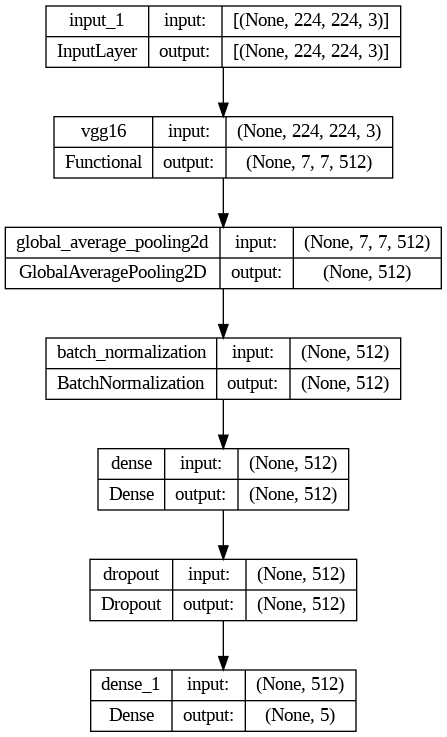

In [ ]:
# Plot layers
tf.keras.utils.plot_model(model_func_transfer_improved, show_shapes=True)


Diagram di atas menggambarkan arsitektur model pembelajaran transfer, memberikan gambaran umum tentang struktur dan komponennya.

**Model Training**

In [ ]:
%%time

# Train the model
history_func_transfer_improved = model_func_transfer_improved.fit(train_generator_improved,
                                                                  epochs=25,
                                                                  validation_data=val_generator_improved,
                                                                  callbacks=[early_stopping, lr_scheduler, reduce_lr]
                                                                  )



Epoch 1: LearningRateScheduler setting learning rate to 0.001.
Epoch 1/25
32/32 [==============================] - 23s 664ms/step - loss: 4.9953 - accuracy: 0.8090 - val_loss: 4.9762 - val_accuracy: 0.4960 - lr: 0.0010

Epoch 2: LearningRateScheduler setting learning rate to 0.001.
Epoch 2/25
32/32 [==============================] - 21s 642ms/step - loss: 3.3436 - accuracy: 0.9430 - val_loss: 3.7299 - val_accuracy: 0.5360 - lr: 0.0010

Epoch 3: LearningRateScheduler setting learning rate to 0.001.
Epoch 3/25
32/32 [==============================] - 22s 672ms/step - loss: 2.3337 - accuracy: 0.9540 - val_loss: 2.7984 - val_accuracy: 0.6400 - lr: 0.0010

Epoch 4: LearningRateScheduler setting learning rate to 0.001.
Epoch 4/25
32/32 [==============================] - 21s 669ms/step - loss: 1.6151 - accuracy: 0.9670 - val_loss: 2.1347 - val_accuracy: 0.6960 - lr: 0.0010

Epoch 5: LearningRateScheduler setting learning rate to 0.001.
Epoch 5/25
32/32 [==============================] - 21s 

Proses pelatihan model berjalan selama 21 epoch dengan total waktu sekitar 8 menit 26 detik. Pada epoch pertama, learning rate ditetapkan sebesar 0.001 dan secara bertahap menurun sesuai dengan scheduler yang telah ditetapkan. Model menunjukkan peningkatan akurasi secara konsisten baik pada data pelatihan maupun validasi.

**Loss dan Akurasi:**
- Pada akhir epoch ke-21, model mencapai loss pelatihan sebesar 0.1909 dan akurasi pelatihan 97.8%.
- Pada data validasi, loss validasi tercatat sebesar 0.4093 dengan akurasi validasi 89.6%.

Epochs dilatih sebanyak 25 kali dengan strategi learning rate scheduling dan early stopping. Hasil evaluasi menunjukkan akurasi yang tinggi baik pada data pelatihan, validasi, dan uji, yang mengindikasikan bahwa model berhasil mengatasi overfitting yang terlihat pada model sebelumnya.

**Model Evaluation**

In [ ]:
# Evaluate the model on training, validation, and test data
results_train_func = model_func_transfer_improved.evaluate(train_generator_improved, verbose=0)
results_val_func = model_func_transfer_improved.evaluate(val_generator_improved, verbose=0)
results_test_func = model_func_transfer_improved.evaluate(test_generator_improved, verbose=0)

# Display
print(f"Functional Model - Train accuracy: {results_train_func[1]:.4f}, Train loss: {results_train_func[0]:.4f}")
print(f"Functional Model - Validation accuracy: {results_val_func[1]:.4f}, Validation loss: {results_val_func[0]:.4f}")
print(f"Functional Model - Test accuracy: {results_test_func[1]:.4f}, Test loss: {results_test_func[0]:.4f}")



Functional Model - Train accuracy: 0.9890, Train loss: 0.2158
Functional Model - Validation accuracy: 0.9360, Validation loss: 0.3696
Functional Model - Test accuracy: 0.9200, Test loss: 0.3858


**Explanation:**

**Plot Training & Validation Accuracy and Loss**

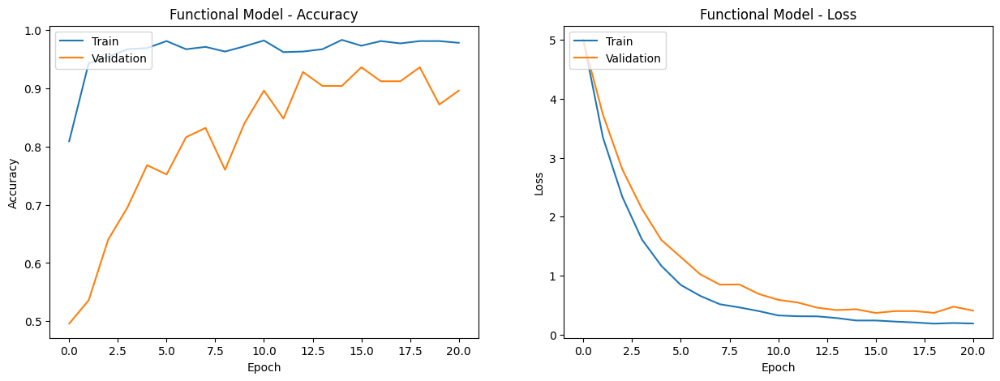

In [ ]:
# Plot training & validation accuracy values for Functional Model
plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
plt.plot(history_func_transfer_improved.history['accuracy'])
plt.plot(history_func_transfer_improved.history['val_accuracy'])
plt.title('Functional Model - Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values for Functional Model
plt.subplot(1, 2, 2)
plt.plot(history_func_transfer_improved.history['loss'])
plt.plot(history_func_transfer_improved.history['val_loss'])
plt.title('Functional Model - Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

Grafik menunjukkan tren peningkatan akurasi dan penurunan loss baik pada data latih maupun validasi. Pada beberapa epoch awal, terdapat sedikit fluktuasi pada data validasi, namun secara keseluruhan model berhasil mencapai stabilitas dengan kinerja yang tinggi.


Hal ini menunjukkan tren positif dimana akurasi terus meningkat dan loss menurun seiring bertambahnya epoch. Ini menunjukkan bahwa model tidak hanya belajar dari data pelatihan tetapi juga mampu menggeneralisasi dengan baik pada data validasi.

Secara keseluruhan, penggunaan transfer learning dengan model functional dan perbaikan pada augmentasi data terbukti efektif dalam meningkatkan performa model, baik dalam hal akurasi maupun kemampuan generalisasi.

**Check the Performance of Train-set and Test-set**

In [ ]:
# Check the performance of test-set for Functional Model
y_pred_prob_test4 = model_func_transfer_improved.predict(test_generator_improved)
y_pred_class_test4 = np.argmax(y_pred_prob_test4, axis=1)
y_true_test4 = test_generator_improved.classes
class_names_seq = list(train_generator_improved.class_indices.keys())

# Display Classification Report for Functional Model
print("Sequential Model - Classification Report - Test Data")
print(classification_report(y_true_test4, y_pred_class_test4, target_names=class_names_seq))


4/4 [==============================] - 2s 380ms/step
Sequential Model - Classification Report - Test Data
              precision    recall  f1-score   support

     Cabbage       0.86      1.00      0.93        25
    Capsicum       1.00      0.92      0.96        25
      Carrot       0.95      0.80      0.87        25
 Cauliflower       1.00      0.96      0.98        25
     Pumpkin       0.82      0.92      0.87        25

    accuracy                           0.92       125
   macro avg       0.93      0.92      0.92       125
weighted avg       0.93      0.92      0.92       125



Classification Report  menunjukkan akurasi yang tinggi untuk setiap kelas, dengan rata-rata akurasi makro 93% dan weighted 92%. Confusion Matrix menunjukkan bahwa model memiliki kemampuan prediksi yang baik untuk semua kelas, dengan jumlah kesalahan yang minimal.

Secara keseluruhan, model functional dengan transfer learning dan augmented data memberikan peningkatan signifikan dalam hal akurasi dan kemampuan generalisasi dibandingkan model sebelumnya. Model ini berhasil mengatasi masalah overfitting dan mampu memprediksi dengan baik pada data baru.


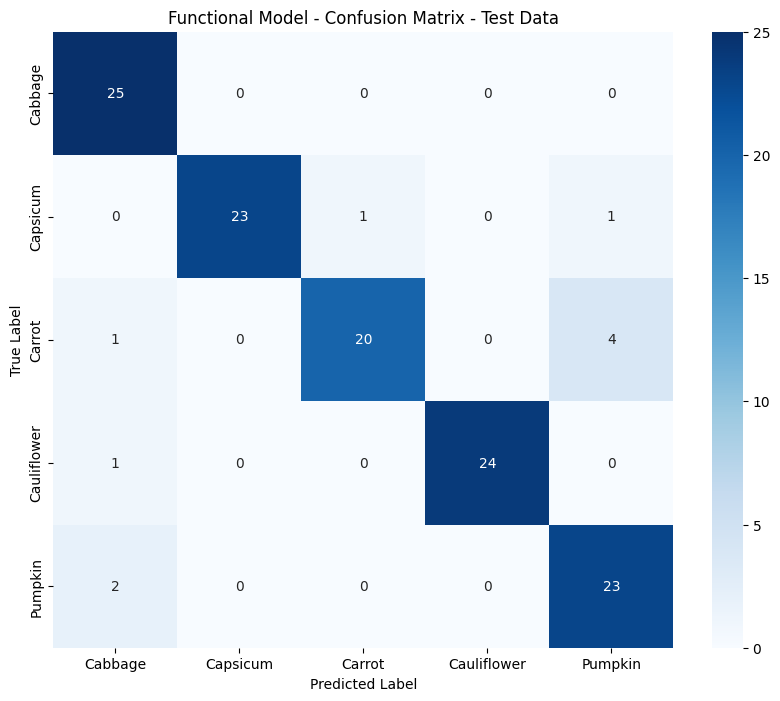

In [ ]:
# Generate the confusion matrix for Functional Model
cm_test_func = confusion_matrix(y_true_test4, y_pred_class_test4)

# Plot confusion matrix for the test data for Functional Model
plt.figure(figsize=(10, 8))
sns.heatmap(cm_test_func, annot=True, fmt='d', cmap='Blues', xticklabels=class_names_func, yticklabels=class_names_func)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Functional Model - Confusion Matrix - Test Data')
plt.show()


1/1 [==============================] - 0s 18ms/step


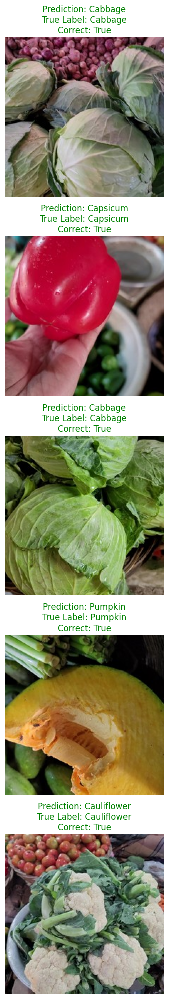

In [ ]:


def predict_random_func(model, num_images=5):
    # Create subplots for displaying multiple images
    fig, axes = plt.subplots(num_images, 1, figsize=(6, 4*num_images))

    for i in range(num_images):
        # Randomly select a class from the available class names
        label = random.choice(class_names)

        # Get the path to the folder containing images for the selected class
        image_path = os.path.join(test_path, label)

        # Get a list of all images in the folder
        images_in_folder = os.listdir(image_path)

        # Randomly select an image from the list
        random_image = random.choice(images_in_folder)

        # Construct the full path to the randomly selected image
        image_path = os.path.join(image_path, random_image)

        # Load and preprocess the randomly selected image
        img_ = image.load_img(image_path, target_size=(224, 224))
        img_array = image.img_to_array(img_)
        img_processed = np.expand_dims(img_array, axis=0)
        img_processed /= 255.

        # Perform prediction using the model
        prediction = model.predict(img_processed)
        index = np.argmax(prediction)
        predicted_label = class_names[index]

        # Check if prediction is correct
        is_correct = (predicted_label == label)

        # Display the image and prediction result
        ax = axes[i]
        ax.imshow(img_array)
        ax.set_title(f"Prediction: {predicted_label}\nTrue Label: {label}\nCorrect: {is_correct}", color='green' if is_correct else 'red')
        ax.axis('off')

    plt.tight_layout()
    plt.show()

# Use the function with the functional model
predict_random_func(model_func_transfer_improved, num_images=5)


Dibuktikan dengan funtional API memprediksi semua class dengan benar.

### **7.4 - Best Model**

Perbandingan hasil evaluasi antara model Sequential API dan Functional API menunjukkan bahwa model Functional API dengan Transfer Learning menghasilkan performa yang lebih baik.

In [ ]:
import pandas as pd

# Misalkan hasil evaluasi model Sequential API
results_train_seq = [0.9530, 0.2806]  # [accuracy, loss]
results_val_seq = [0.8560, 1.4994]    # [accuracy, loss]
results_test_seq = [0.8640, 0.8541]   # [accuracy, loss]

# Misalkan hasil evaluasi model Functional API
results_train_func = [0.9890, 0.2158] # [accuracy, loss]
results_val_func = [0.9360, 0.3696]   # [accuracy, loss]
results_test_func = [0.9200, 0.3858]  # [accuracy, loss]

# Buat dictionary dengan hasil evaluasi
data = {
    'Metric': ['Train accuracy', 'Train loss', 'Validation accuracy', 'Validation loss', 'Test accuracy', 'Test loss'],
    'Sequential API': [results_train_seq[0], results_train_seq[1], results_val_seq[0], results_val_seq[1], results_test_seq[0], results_test_seq[1]],
    'Functional API': [results_train_func[0], results_train_func[1], results_val_func[0], results_val_func[1], results_test_func[0], results_test_func[1]]
}

# Buat DataFrame
comparison_df = pd.DataFrame(data)

# Display DataFrame
comparison_df

,Metric,Sequential API,Functional API
0,Train accuracy,0.9530,0.9890
1,Train loss,0.2806,0.2158
2,Validation accuracy,0.8560,0.9360
3,Validation loss,1.4994,0.3696
4,Test accuracy,0.8640,0.9200
5,Test loss,0.8541,0.3858


Explanation:

- Model Functional API menunjukkan akurasi yang lebih tinggi dan loss yang lebih rendah pada data pelatihan.
- Model Functional API juga unggul dalam akurasi dan loss pada data validasi, menunjukkan kemampuan generalisasi yang lebih baik.
- Pada data pengujian, model Functional API tetap menunjukkan kinerja yang lebih baik dibandingkan model Sequential API.

Dengan hasil ini, jelas bahwa model Functional API dengan Transfer Learning memiliki performa yang lebih baik dalam hal akurasi dan loss. Oleh karena itu, model Functional API dipilih untuk langkah selanjutnya, yaitu **model saving.**

## **8. Model Saving**


Setelah melatih beberapa model, dapat disimpulkan bahwa model akhir yang menggunakan transfer learning with VGG16 lebih unggul dibanding model lainnya. Hasilnya, model yang disimpan yaitu **Functional Model dengan Transfer Learning.**

In [ ]:
# Model summary
model_func_transfer_improved.trainable = False
model_func_transfer_improved.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 global_average_pooling2d (  (None, 512)               0         
 GlobalAveragePooling2D)                                         
                                                                 
 batch_normalization (Batch  (None, 512)               2048      
 Normalization)                                                  
                                                                 
 dense (Dense)               (None, 512)               262656    
                                                                 
 dropout (Dropout)           (None, 512)               0     


Model ini menggunakan arsitektur VGG16 dengan parameter **14,981,957**, yang semuanya Non-trainable params. Ukuran model akhir adalah **57.15 MB**, dan menghasilkan lima kelas.

In [ ]:
model_func_transfer_improved.save('model_func_transfer_improved.h5')
model_func_transfer_improved.save('model_func_transfer_improved.keras')

# Simpan ke gdrive juga
model_func_transfer_improved.save('/content/drive/MyDrive/model_func_transfer_improved.keras')


Model disimpan dalam format h5 dan Keras, dengan cadangan disimpan secara otomatis di Google Drive.

## **9. Model Inference**


Akan dilakukan pada file terpisah dengan nama **`P2G7_Iznia_Azyati_Inference.ipynb`**

## **10. Kesimpulan**


#### **a. EDA**



- **Image Visualizations:** Berdasarkan visualisasi gambar, masing-masing kelas sayuran menunjukkan karakteristik yang berbeda. Cabbage dan Cauliflower memiliki tekstur dan warna yang mirip, sedangkan Capsicum dan Carrot menunjukkan warna yang lebih cerah dan berbeda.

- **Class Distributions**: Dataset terdiri dari distribusi yang seimbang di antara lima kelas: Cabbage, Capsicum, Carrot, Cauliflower, dan Pumpkin, masing-masing memiliki 25 gambar dalam set pengujian.

- **Pixel Intensity Statistics:** Rata-rata intensitas piksel dan standar deviasi untuk setiap kelas menunjukkan variasi yang signifikan, dengan Cabbage memiliki intensitas rata-rata tertinggi dan Pumpkin terendah. Hal ini dapat mempengaruhi model dalam mengidentifikasi dan mengklasifikasikan gambar berdasarkan intensitas pikselnya.

#### **b. Model Evaluation**



- Best Model:

  Model terbaik adalah model Transfer Learning dengan arsitektur VGG16, berdasarkan performa pada data pelatihan, validasi, dan pengujian. Model ini dipilih karena kesederhanaan dalam workflow dan konstruksi layer-by-layer yang jelas. Transfer learning meningkatkan performa dengan menggunakan bobot pra-latih dari model VGG16, yang telah dilatih pada dataset yang luas dan beragam, memberikan titik awal yang kuat. Kombinasi ini meningkatkan performa secara signifikan dibandingkan dengan model sequential atau functional standalone.

- Training vs Validation:
  Model menunjukkan kesesuaian yang baik antara loss dan akurasi pada pelatihan dan validasi.

- Metrics Evaluation:

    - Sequential Model: Model Sequential mencapai akurasi pelatihan 95.30% dan akurasi validasi 85.60%. Meskipun menunjukkan performa yang baik pada data pelatihan, akurasi validasi menunjukkan bahwa model ini sedikit overfitting.
    - Functional Model: Model Functional menunjukkan performa yang lebih baik dengan akurasi pelatihan 98.90% dan akurasi validasi 93.60%. Model ini memiliki kemampuan generalisasi yang lebih baik dibandingkan model Sequential.

- Model Fit
  
  Model menunjukkan kesesuaian yang baik antara set pelatihan dan pengujian.

- Prediction Capability
  
  Model mampu memprediksi dengan baik untuk semua kelas, namun memiliki kesulitan dalam memprediksi kelas tertentu seperti Pumpkin.

- Model Advantages:
    - Transfer Learning: Dengan menggunakan model VGG16 yang telah dilatih sebelumnya dan penambahan lapisan ANN, performa model meningkat secara signifikan. Model Sequential dengan transfer learning mencapai akurasi pengujian 86.40%, sedangkan model Functional mencapai akurasi pengujian 92.00%.
    - Improved Augmentation: Teknik augmentasi yang ditingkatkan membantu model untuk lebih menggeneralisasi data baru, terbukti dengan peningkatan akurasi pada set validasi dan pengujian.
    - Akurasi tinggi pada data pelatihan menunjukkan bahwa model memiliki kesesuaian yang baik dengan data yang dilatih. Akurasi tinggi ini bermanfaat untuk skenario di mana data pelatihan representatif dari skenario penggunaan yang khas.
    - Model menunjukkan kemampuan belajar yang kuat, terlihat dari penurunan loss yang stabil dan peningkatan akurasi pelatihan. Hal ini menunjukkan bahwa model efektif dalam menangkap pola dan hubungan dalam dataset.

- Model Limitations:

  - Perbedaan antara akurasi pelatihan dan validasi, terutama saat akurasi validasi mencapai puncak dan kemudian menurun, menunjukkan kemungkinan overfitting. Overfitting terjadi ketika model belajar detail dan noise dalam data pelatihan hingga mempengaruhi performa model pada data baru.







#### **c. Model Improvement**



- Mencoba model lanjutan lainnya seperti EfficientNetB7 yang dikenal memiliki performa tinggi dalam tugas klasifikasi gambar. Ini berpotensi menghasilkan hasil yang lebih baik dibandingkan dengan model saat ini.

- Mempertimbangkan untuk mengakuisisi data tambahan untuk kelas yang kurang terwakili untuk mencapai dataset yang lebih seimbang. Ini akan membantu model dalam belajar lebih baik dan menghasilkan prediksi yang lebih akurat.

-  Mengimplementasikan teknik preprocessing gambar tambahan, seperti peningkatan kontras dan deteksi tepi, dapat membantu membuat fitur lebih dapat dibedakan, sehingga memudahkan model untuk memprediksi kasus dengan akurasi yang lebih tinggi.


#### **d. Bussiness Insights**



- Identifikasi Sayuran: Dengan akurasi tinggi dalam mengklasifikasikan berbagai jenis sayuran, model ini dapat diimplementasikan dalam aplikasi pertanian cerdas untuk membantu petani dalam mengidentifikasi dan mengelompokkan hasil panen mereka secara otomatis.
- Efisiensi Operasional: Peningkatan akurasi model dapat mengurangi kesalahan dalam pengelompokan dan pengemasan sayuran, yang pada gilirannya meningkatkan efisiensi operasional dan mengurangi biaya produksi.

### **Final Conclusion**



Model Functional yang memanfaatkan Transfer Learning dengan arsitektur **VGG16** mengungguli model lainnya, menunjukkan kesesuaian yang baik dengan akurasi pelatihan sebesar 0.98 dan akurasi pengujian sebesar **0.92**. Sementara model ini mampu mengklasifikasikan gambar sayuran dengan akurat, tetapi model ini masih perlu untuk meningkatkan akurasi keseluruhan dan kinerja model dalam berbagai kondisi nyata.







